# Telecom Churn Case study

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal.

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.
 
In this project, we will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

## Importing the Libraries

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows',500)

## Data Reading

In [0]:
df = pd.read_csv('telecom_churn_data.csv')
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

## Data Understanding

In [0]:
df.shape

(99999, 226)

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [0]:
### Unique datatypes
df.dtypes.unique()

array([dtype('int64'), dtype('float64'), dtype('O')], dtype=object)

In [0]:
## Numeric columns
num_cols = [col for col in df.columns if df[col].dtype in ['int64','float64']]
len(num_cols)

214

In [0]:
## Categorical columns
cat_cols = [col for col in df.columns if df[col].dtype in ['object']]
len(cat_cols)

12

In [0]:
df[num_cols].head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.

In [0]:
df[cat_cols].head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,NaN
1,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014,NaN,7/25/2014,8/10/2014,NaN
2,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014,NaN,NaN,NaN,9/17/2014
3,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014,NaN,NaN,NaN,NaN
4,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,NaN,NaN,NaN


The above cat_cols are not actual categorical columns they seem to be columns of date datatype.

### DATA CLEANING

#### Dropping Unnecessary columns

In [0]:
## Dropping all the date columns as they are not useful for predicting whether a customer will churn or not
df = df.drop(['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9','date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9'],axis=1)

In [0]:
## Dropping mobile number column as it is not useful for prediction
df = df.drop('mobile_number',axis=1)

In [0]:
### checking for columns having only 1 unique value
df.loc[:,df.apply(pd.Series.nunique) == 1].head(5)

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9
0,109,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN
1,109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
### Dropping columns having only 1 unique value
df = df.loc[:,df.apply(pd.Series.nunique) != 1]

In [0]:
df.shape

(99999, 201)

#### Missing Values

In [0]:
### checking % of missing values in each column
### Keeping the columna names and their respective missing value percentage in a seperate dataframe
miss_value_df = pd.DataFrame({'Column_Name':df.columns,
                             'Percent_missing': round(df.isnull().sum() * 100 / len(df),2)})
miss_value_df.sort_values('Percent_missing',inplace=True,ascending=False)
miss_value_df

,Column_Name,Percent_missing
total_rech_data_6,total_rech_data_6,74.85
arpu_3g_6,arpu_3g_6,74.85
arpu_2g_6,arpu_2g_6,74.85
fb_user_6,fb_user_6,74.85
max_rech_data_6,max_rech_data_6,74.85
night_pck_user_6,night_pck_user_6,74.85
count_rech_2g_6,count_rech_2g_6,74.85
count_rech_3g_6,count_rech_3g_6,74.85
av_rech_amt_data_6,av_rech_amt_data_6,74.85
count_rech_3g_7,count_rech_3g_7,74.43


In [0]:
### Dropping columns having morethan 70% missing values
cols=list(miss_value_df[miss_value_df['Percent_missing'] >70].index)
df.drop(cols,axis=1,inplace=True)

In [0]:
miss_value_df = pd.DataFrame({'Column_Name':df.columns,
                             'Percent_missing': round(df.isnull().sum() * 100 / len(df),2)})
miss_value_df.sort_values('Percent_missing',inplace=True,ascending=False)
miss_value_df

,Column_Name,Percent_missing
og_others_9,og_others_9,7.75
std_ic_mou_9,std_ic_mou_9,7.75
loc_og_t2c_mou_9,loc_og_t2c_mou_9,7.75
loc_og_mou_9,loc_og_mou_9,7.75
loc_ic_mou_9,loc_ic_mou_9,7.75
loc_og_t2f_mou_9,loc_og_t2f_mou_9,7.75
std_og_t2t_mou_9,std_og_t2t_mou_9,7.75
std_ic_t2m_mou_9,std_ic_t2m_mou_9,7.75
loc_og_t2m_mou_9,loc_og_t2m_mou_9,7.75
std_og_t2m_mou_9,std_og_t2m_mou_9,7.75


In [0]:
### Removing the entires for Zero percent  from missing value dataframe
miss_value_df=miss_value_df.drop(miss_value_df[miss_value_df['Percent_missing'] == 0].index)
miss_value_df

,Column_Name,Percent_missing
og_others_9,og_others_9,7.75
std_ic_mou_9,std_ic_mou_9,7.75
loc_og_t2c_mou_9,loc_og_t2c_mou_9,7.75
loc_og_mou_9,loc_og_mou_9,7.75
loc_ic_mou_9,loc_ic_mou_9,7.75
loc_og_t2f_mou_9,loc_og_t2f_mou_9,7.75
std_og_t2t_mou_9,std_og_t2t_mou_9,7.75
std_ic_t2m_mou_9,std_ic_t2m_mou_9,7.75
loc_og_t2m_mou_9,loc_og_t2m_mou_9,7.75
std_og_t2m_mou_9,std_og_t2m_mou_9,7.75


#### Iterative Imputer

In [0]:
### Using iterative imputer for columns lessthan 10% missing values
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [0]:
ii = IterativeImputer()
df_clean = pd.DataFrame(ii.fit_transform(df))
df_clean.columns = df.columns

In [0]:
100*df_clean.isnull().sum()/len(df_clean)

arpu_6                0.0
arpu_7                0.0
arpu_8                0.0
arpu_9                0.0
onnet_mou_6           0.0
onnet_mou_7           0.0
onnet_mou_8           0.0
onnet_mou_9           0.0
offnet_mou_6          0.0
offnet_mou_7          0.0
offnet_mou_8          0.0
offnet_mou_9          0.0
roam_ic_mou_6         0.0
roam_ic_mou_7         0.0
roam_ic_mou_8         0.0
roam_ic_mou_9         0.0
roam_og_mou_6         0.0
roam_og_mou_7         0.0
roam_og_mou_8         0.0
roam_og_mou_9         0.0
loc_og_t2t_mou_6      0.0
loc_og_t2t_mou_7      0.0
loc_og_t2t_mou_8      0.0
loc_og_t2t_mou_9      0.0
loc_og_t2m_mou_6      0.0
loc_og_t2m_mou_7      0.0
loc_og_t2m_mou_8      0.0
loc_og_t2m_mou_9      0.0
loc_og_t2f_mou_6      0.0
loc_og_t2f_mou_7      0.0
loc_og_t2f_mou_8      0.0
loc_og_t2f_mou_9      0.0
loc_og_t2c_mou_6      0.0
loc_og_t2c_mou_7      0.0
loc_og_t2c_mou_8      0.0
loc_og_t2c_mou_9      0.0
loc_og_mou_6          0.0
loc_og_mou_7          0.0
loc_og_mou_8

In [0]:
df_clean.shape

(99999, 165)

### Filtering Hign Value Customers

In [0]:
df_clean.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,131.617071,127.774802,0.00,134.610501,198.801004,195.910021,0.00,187.400294,18.158028,-11.77084,0.00,15.189839,24.36589,17.382083,0.00,12.763892,47.101123,46.4747,0.00,44.584545,93.343043,91.397247,0.00,90.462449,3.731588,3.799525,0.00,3.59752,13.881015,12.304616,0.00,1.84338,144.177912,141.694041,0.00,138.648706,79.827779,83.304413,0.00,82.343234,87.301979,90.801182,0.00,86.278158,1.122776,1.123356,0.00,1.019136,168.253091,175.233125,0.00,169.641602,0.79954,0.776943,0.0,0.724756,3.909476,4.952416,0.00,4.402046,-317.102418,-322.643325,0.0,-313.412786,0.00,0.00,0.00,0.00,47.925611,47.988199,0.16,46.275968,107.472134,107.123547,4.13,106.161813,12.273749,13.535645,1.15,11.542036,167.671429,168.655467,5.44,163.983059,9.566328,10.013629,0.00,9.433614,20.727402,21.659651,0.00,19.613064,2.345187,2.599754,0.00,1.946542,32.639167,34.272125,0.00,30.993764,0.00,0.00,5.44,0.00,-0.519587,0.006143,0.0,-0.002841,7.460155,8.333691,0.0,8.061444,-207.243793,-211.265687,0.0,-203.029719,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,968.0,30.4,0.0,101.20,3.58
1,34.047,355.074,268.321,86.285,24.110000,78.680000,7.68,18.340000,15.740000,99.840000,304.76,53.760000,0.000000,0.00000,0.00,0.000000,0.00000,0.000000,0.00,0.000000,23.880000,74.5600,7.68,18.340000,11.510000,75.940000,291.86,53.760000,0.000000,0.000000,0.00,0.00000,0.000000,2.910000,0.00,0.00000,35.390000,150.510000,299.54,72.110000,0.230000,4.110000,0.00,0.000000,0.000000,0.460000,0.13,0.0

In [0]:
df_clean.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=165)

In [0]:
cols_6 = [col for col in df_clean.columns if '_6' in col]
cols_7 = [col for col in df_clean.columns if '_7' in col]
cols_8 = [col for col in df_clean.columns if '_8' in col]
cols_678 = cols_6 + cols_7 + cols_8

In [0]:
### Adding other needed columns for filtering High Value Cutomers
cols_678 = cols_678 + ['aon','jun_vbc_3g','jul_vbc_3g','aug_vbc_3g']

In [0]:
### Creating dtatframe using 6th ,7th and 8th month data
df_678 = df_clean[cols_678]

In [0]:
df_678.shape

(99999, 124)

In [0]:
df_678.head()

,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,total_rech_amt_6,max_rech_amt_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,total_rech_amt_7,max_rech_amt_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,jul_vbc_3g,aug_vbc_3g
0,197.385,131.617071,198.801004,18.158028,24.36589,47.101123,93.343043,3.731588,13.881015,144.177912,79.827779,87.301979,1.122776,168.253091,0.79954,3.909476,-317.102418,0.00,47.925611,107.472134,12.273749,167.671429,9.566328,20.727402,2.345187,32.639167,0.00,-0.519587,7.460155,-207.243793,4.0,362.0,252.0,252.0,30.13,83.57,0.0,0.0,1.0,0.0,214.816,127.774802,195.910021,-11.77084,17.382083,46.4747,91.397247,3.799525,12.304616,141.694041,83.304413,90.801182,1.123356,175.233125,0.776943,4.952416,-322.643325,0.00,47.988199,107.123547,13.535645,168.655467,10.013629,21.659651,2.599754,34.272125,0.00,0.006143,8.333691,-211.265687,3.0,252.0,252.0,252.0,1.32,150.76,0.0,0.0,1.0,0.0,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.16,4.13,1.15,5.44,0.00,0.00,0.00,0.00,5.44,0.0,0.0,0.0,2.0,252.0,252.0,252.0,5.75,109.61,0.0,0.0,1.0,0.0,968.0,101.20,0.0,30.4
1,34.047,24.110000,15.740000,0.000000,0.00000,23.880000,11.510000,0.000000,0.000000,35.390000,0.230000,0.000000,0.000000,0.230000,0.00000,4.680000,0.000000,40.31,1.610000,17.480000,0.000000,19.090000,0.000000,5.900000,0.000000,5.900000,26.83,0.000000,1.830000,0.000000,4.0,74.0,44.0,44.0,0.00,0.00,0.0,0.0,0.0,0.0,355.074,78.680000,99.840000,0.00000,0.000000,74.5600,75.940000,0.000000,2.910000,150.510000,4.110000,0.460000,0.000000,4.580000,0.000000,23.430000,0.000000,178.53,29.910000,65.380000,8.930000,104.230000,0.000000,0.000000,0.000000,0.000000,104.23,0.000000,0.000000,0.000000,9.0,384.0,154.0,23.0,108.07,0.00,1.0,0.0,0.0,0.0,268.321,7.68,304.76,0.00,0.00,7.68,291.86,0.00,0.00,299.54,0.00,0.13,0.00,0.13,0.0,12.76,0.0,312.44,29.23,375.58,3.61,408.43,2.35,12.49,0.00,14.84,423.28,0.0,0.0,0.0,11.0,283.0,65.0,30.0,365.47,0.00,0.0,2.0,0.0,0.0,1006.0,0.00,0.0,0.0
2,167.690,11.540000,143.330000,0.000000,0.00000,7.190000,29.340000,24.110000,0.000000,60.660000,4.340000,41.810000,1.480000,47.640000,0.00000,46.560000,0.450000,155.33,115.690000,14.380000,99.480000,229.560000,72.410000,45.180000,21.730000,139.330000,370.04,0.210000,0.000000,0.930000,5.0,168.0,86.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,189.058,55.240000,220.590000,0.00000,0.000000,28.7400,16.860000,21.790000,135.540000,67.410000,26.490000,67.410000,14.

#### Derived Column

In [0]:
### Creating average recharge amount using month 6 and month 7 total recharge amount (good Phase)
df_678['avg_rech_amt_6_7'] = (df_clean['total_rech_amt_6'] + df_clean['total_rech_amt_7'])/2

In [0]:
df_678[['total_rech_amt_6','total_rech_amt_7','avg_rech_amt_6_7']].head()

,total_rech_amt_6,total_rech_amt_7,avg_rech_amt_6_7
0,362.0,252.0,307.0
1,74.0,384.0,229.0
2,168.0,315.0,241.5
3,230.0,310.0,270.0
4,196.0,350.0,273.0


In [0]:
### Dropping total_rech_amt_6 and total_rech_amt_7
df_678.drop(['total_rech_amt_6','total_rech_amt_7'],axis=1,inplace=True)

In [0]:
### Finding 70th and 80th percentile values for column average recharge amount
df_678['avg_rech_amt_6_7'].describe(percentiles=[.70,.80]) 

count    99999.000000
mean       325.238792
std        370.833466
min          0.000000
50%        229.000000
70%        368.500000
80%        485.000000
max      37762.500000
Name: avg_rech_amt_6_7, dtype: float64

In [0]:
### Filtering High Value Customer column whose average recharge amount is greater than 70% percentile i.e, top 30 % customers

df_678_HVC = df_678.loc[df_678['avg_rech_amt_6_7'] > 368]

In [0]:
df_678_HVC.head()

,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,max_rech_amt_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,jul_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7
7,1069.180,57.84,453.43,16.23,23.74,51.39,308.63,62.13,0.0,422.16,4.30,49.89,6.66,60.86,0.0,4.50,0.00,487.53,58.14,217.56,152.16,427.88,36.89,91.44,52.19,180.54,626.46,0.21,2.06,15.74,5.0,1580.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1349.850,54.68,567.16,33.49,12.59,31.38,447.38,55.14,0.0,533.91,23.29,31.76,20.08,75.14,0.18,0.00,0.0,609.24,32.26,221.49,101.46,355.23,11.83,126.99,34.24,173.08,558.04,0.0,14.53,15.19,5.0,790.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,255.79,12.01,49.14,16.68,77.84,10.01,6.50,0.0,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7.0,3638.0,1580.0,779.0,0.00,0.00,0.0,0.0,0.0,0.0,802.0,18.74,19.38,57.74,1185.0
8,378.721,413.69,94.66,0.00,0.00,297.13,80.96,0.00,0.0,378.09,116.56,13.69,0.00,130.26,0.0,0.00,0.00,508.36,23.84,57.58,0.00,81.43,0.00,22.43,0.00,22.43,103.86,0.00,0.00,0.00,19.0,90.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,492.223,351.03,80.63,0.00,0.00,217.59,70.58,0.00,0.0,288.18,133.43,10.04,0.00,143.48,0.00,0.00,0.0,431.66,9.84,13.98,0.00,23.83,0.58,4.08,0.00,4.66,28.49,0.0,0.00,0.00,21.0,154.0,0.0,356.0,750.95,1.0,1.0,0.0,0.0,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,63.04,22.58,75.69,0.00,98.28,0.00,10.23,0.0,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14.0,120.0,30.0,10.0,0.03,11.94,0.0,3.0,0.0,0.0,315.0,122.16,910.65,21.03,519.0
13,492.846,501.76,413.31,23.53,7.98,49.63,151.13,4.54,0.0,205.31,446.41,255.36,0.00,701.78,0.0,0.00,0.00,907.09,67.88,142.88,4.81,215.58,115.68,308.13,0.00,423.81,968.61,0.45,245.28,83.48,6.0,110.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,205.671,108.39,119.28,144.24,35.26,6.19,47.28,0.00,0.0,53.48,85.98,52.94,0.00,138.93,0.00,0.00,0.0,192.41,7.58,18.53,0.00,26.11,38.29,29.79,0.00,68.09,172.58,0.0,62.11,16.24,4.0,110.0,50.0,0.0,0.00,0.0,0.0,0.0,0.0,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,0.49,353.99,498.23,156.94,0.00,655.18,1.29,4.78,0.0,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11.0,717.0,130.0,0.0,0.02,0.00,0.0,3.0,0.0,0.0,2607.0,0.00,0.00,0.00,380.0
16,430.975,50.51,296.29,0.00,0.00,42.61,273.29,0.00,0.0,315.91,7.89,22.99,0.00,30.89,0.0,0.00,0.00,346.81,41.33,226.81,8.71,276.86,68.79,18.68,0.

In [0]:
df_678_HVC.shape

(30011, 123)

As mentioned in the problem statement we were able to get 30k rows

### Deriving Churn

In [0]:
### Taking 9th month data from df_clean
df_temp_9 = df_clean[df_clean.index.isin(df_678_HVC.index)]

In [0]:
df_temp_9.shape

(30011, 165)

In [0]:
### Taking 9th month columns
cols_9 = ['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']
df_temp_9 = df_temp_9[cols_9]

In [0]:
df_temp_9.shape

(30011, 4)

In [0]:
### Concating two dataframes - Adding 9th month data to 6th and 7th month High value customers data
df_678_HVC = pd.concat([df_678_HVC,df_temp_9],axis = 1)

In [0]:
df_678_HVC.shape

(30011, 127)

In [0]:
df_678_HVC.head()

,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,max_rech_amt_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,jul_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
7,1069.180,57.84,453.43,16.23,23.74,51.39,308.63,62.13,0.0,422.16,4.30,49.89,6.66,60.86,0.0,4.50,0.00,487.53,58.14,217.56,152.16,427.88,36.89,91.44,52.19,180.54,626.46,0.21,2.06,15.74,5.0,1580.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1349.850,54.68,567.16,33.49,12.59,31.38,447.38,55.14,0.0,533.91,23.29,31.76,20.08,75.14,0.18,0.00,0.0,609.24,32.26,221.49,101.46,355.23,11.83,126.99,34.24,173.08,558.04,0.0,14.53,15.19,5.0,790.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,255.79,12.01,49.14,16.68,77.84,10.01,6.50,0.0,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7.0,3638.0,1580.0,779.0,0.00,0.00,0.0,0.0,0.0,0.0,802.0,18.74,19.38,57.74,1185.0,0.00,0.00,0.0,0.0
8,378.721,413.69,94.66,0.00,0.00,297.13,80.96,0.00,0.0,378.09,116.56,13.69,0.00,130.26,0.0,0.00,0.00,508.36,23.84,57.58,0.00,81.43,0.00,22.43,0.00,22.43,103.86,0.00,0.00,0.00,19.0,90.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,492.223,351.03,80.63,0.00,0.00,217.59,70.58,0.00,0.0,288.18,133.43,10.04,0.00,143.48,0.00,0.00,0.0,431.66,9.84,13.98,0.00,23.83,0.58,4.08,0.00,4.66,28.49,0.0,0.00,0.00,21.0,154.0,0.0,356.0,750.95,1.0,1.0,0.0,0.0,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,63.04,22.58,75.69,0.00,98.28,0.00,10.23,0.0,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14.0,120.0,30.0,10.0,0.03,11.94,0.0,3.0,0.0,0.0,315.0,122.16,910.65,21.03,519.0,34.91,142.18,0.0,0.0
13,492.846,501.76,413.31,23.53,7.98,49.63,151.13,4.54,0.0,205.31,446.41,255.36,0.00,701.78,0.0,0.00,0.00,907.09,67.88,142.88,4.81,215.58,115.68,308.13,0.00,423.81,968.61,0.45,245.28,83.48,6.0,110.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,205.671,108.39,119.28,144.24,35.26,6.19,47.28,0.00,0.0,53.48,85.98,52.94,0.00,138.93,0.00,0.00,0.0,192.41,7.58,18.53,0.00,26.11,38.29,29.79,0.00,68.09,172.58,0.0,62.11,16.24,4.0,110.0,50.0,0.0,0.00,0.0,0.0,0.0,0.0,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,0.49,353.99,498.23,156.94,0.00,655.18,1.29,4.78,0.0,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11.0,717.0,130.0,0.0,0.02,0.00,0.0,3.0,0.0,0.0,2607.0,0.00,0.00,0.00,380.0,631.86,446.09,0.0,0.0
16,430.975,50.51,296.29,0.00,0

In [0]:
### Creating churn column
df_678_HVC['churn'] = np.where(df_678_HVC[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].sum(axis=1)==0,1,0)

In [0]:
df_678_HVC.shape

(30011, 128)

In [0]:
df_678_HVC.head()

,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,max_rech_amt_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,jul_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9,churn
7,1069.180,57.84,453.43,16.23,23.74,51.39,308.63,62.13,0.0,422.16,4.30,49.89,6.66,60.86,0.0,4.50,0.00,487.53,58.14,217.56,152.16,427.88,36.89,91.44,52.19,180.54,626.46,0.21,2.06,15.74,5.0,1580.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1349.850,54.68,567.16,33.49,12.59,31.38,447.38,55.14,0.0,533.91,23.29,31.76,20.08,75.14,0.18,0.00,0.0,609.24,32.26,221.49,101.46,355.23,11.83,126.99,34.24,173.08,558.04,0.0,14.53,15.19,5.0,790.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,255.79,12.01,49.14,16.68,77.84,10.01,6.50,0.0,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7.0,3638.0,1580.0,779.0,0.00,0.00,0.0,0.0,0.0,0.0,802.0,18.74,19.38,57.74,1185.0,0.00,0.00,0.0,0.0,1
8,378.721,413.69,94.66,0.00,0.00,297.13,80.96,0.00,0.0,378.09,116.56,13.69,0.00,130.26,0.0,0.00,0.00,508.36,23.84,57.58,0.00,81.43,0.00,22.43,0.00,22.43,103.86,0.00,0.00,0.00,19.0,90.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,492.223,351.03,80.63,0.00,0.00,217.59,70.58,0.00,0.0,288.18,133.43,10.04,0.00,143.48,0.00,0.00,0.0,431.66,9.84,13.98,0.00,23.83,0.58,4.08,0.00,4.66,28.49,0.0,0.00,0.00,21.0,154.0,0.0,356.0,750.95,1.0,1.0,0.0,0.0,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,63.04,22.58,75.69,0.00,98.28,0.00,10.23,0.0,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14.0,120.0,30.0,10.0,0.03,11.94,0.0,3.0,0.0,0.0,315.0,122.16,910.65,21.03,519.0,34.91,142.18,0.0,0.0,0
13,492.846,501.76,413.31,23.53,7.98,49.63,151.13,4.54,0.0,205.31,446.41,255.36,0.00,701.78,0.0,0.00,0.00,907.09,67.88,142.88,4.81,215.58,115.68,308.13,0.00,423.81,968.61,0.45,245.28,83.48,6.0,110.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,205.671,108.39,119.28,144.24,35.26,6.19,47.28,0.00,0.0,53.48,85.98,52.94,0.00,138.93,0.00,0.00,0.0,192.41,7.58,18.53,0.00,26.11,38.29,29.79,0.00,68.09,172.58,0.0,62.11,16.24,4.0,110.0,50.0,0.0,0.00,0.0,0.0,0.0,0.0,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,0.49,353.99,498.23,156.94,0.00,655.18,1.29,4.78,0.0,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11.0,717.0,130.0,0.0,0.02,0.00,0.0,3.0,0.0,0.0,2607.0,0.00,0.00,0.00,380.0,631.86,446.09,0.0,0.0,0
16,430.975,50.51,2

In [0]:
### Dropping the 9th month data
df_678_HVC.drop(cols_9,axis=1,inplace=True)

In [0]:
df_678_HVC.shape

(30011, 124)

In [0]:
df_678_HVC.head()

,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,max_rech_amt_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,jul_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7,churn
7,1069.180,57.84,453.43,16.23,23.74,51.39,308.63,62.13,0.0,422.16,4.30,49.89,6.66,60.86,0.0,4.50,0.00,487.53,58.14,217.56,152.16,427.88,36.89,91.44,52.19,180.54,626.46,0.21,2.06,15.74,5.0,1580.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1349.850,54.68,567.16,33.49,12.59,31.38,447.38,55.14,0.0,533.91,23.29,31.76,20.08,75.14,0.18,0.00,0.0,609.24,32.26,221.49,101.46,355.23,11.83,126.99,34.24,173.08,558.04,0.0,14.53,15.19,5.0,790.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,255.79,12.01,49.14,16.68,77.84,10.01,6.50,0.0,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7.0,3638.0,1580.0,779.0,0.00,0.00,0.0,0.0,0.0,0.0,802.0,18.74,19.38,57.74,1185.0,1
8,378.721,413.69,94.66,0.00,0.00,297.13,80.96,0.00,0.0,378.09,116.56,13.69,0.00,130.26,0.0,0.00,0.00,508.36,23.84,57.58,0.00,81.43,0.00,22.43,0.00,22.43,103.86,0.00,0.00,0.00,19.0,90.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,492.223,351.03,80.63,0.00,0.00,217.59,70.58,0.00,0.0,288.18,133.43,10.04,0.00,143.48,0.00,0.00,0.0,431.66,9.84,13.98,0.00,23.83,0.58,4.08,0.00,4.66,28.49,0.0,0.00,0.00,21.0,154.0,0.0,356.0,750.95,1.0,1.0,0.0,0.0,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,63.04,22.58,75.69,0.00,98.28,0.00,10.23,0.0,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14.0,120.0,30.0,10.0,0.03,11.94,0.0,3.0,0.0,0.0,315.0,122.16,910.65,21.03,519.0,0
13,492.846,501.76,413.31,23.53,7.98,49.63,151.13,4.54,0.0,205.31,446.41,255.36,0.00,701.78,0.0,0.00,0.00,907.09,67.88,142.88,4.81,215.58,115.68,308.13,0.00,423.81,968.61,0.45,245.28,83.48,6.0,110.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,205.671,108.39,119.28,144.24,35.26,6.19,47.28,0.00,0.0,53.48,85.98,52.94,0.00,138.93,0.00,0.00,0.0,192.41,7.58,18.53,0.00,26.11,38.29,29.79,0.00,68.09,172.58,0.0,62.11,16.24,4.0,110.0,50.0,0.0,0.00,0.0,0.0,0.0,0.0,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,0.49,353.99,498.23,156.94,0.00,655.18,1.29,4.78,0.0,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11.0,717.0,130.0,0.0,0.02,0.00,0.0,3.0,0.0,0.0,2607.0,0.00,0.00,0.00,380.0,0
16,430.975,50.51,296.29,0.00,0.00,42.61,273.29,0.00,0.0,315.91,7.89,22.99,0.00,30.89,0.0,0.00,0.00,346.81,41.33,226.81,8.71,276.86,68

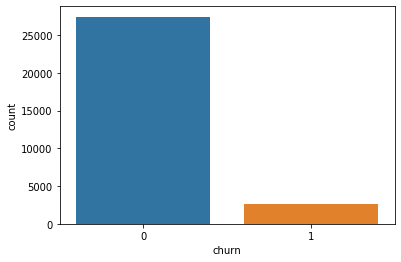

In [0]:
### Count plot on churn column
sns.countplot(x=df_678_HVC['churn'])

### EDA

### Correlation

In [0]:
cor = df_678_HVC.corr()
df_lt = cor.where(np.tril(np.ones(cor.shape)).astype(np.bool))

In [0]:
df_lt

,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,max_rech_amt_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,jul_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7,churn
arpu_6,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
onnet_mou_6,0.289876,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
offnet_mou_6,0.458013,0.004132,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
roam_ic_mou_6,0.107973,0.004395,0.022910,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
roam_og_mou_6,0.176072,0.053278,0.091262,0.641221,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

### Correlation Map

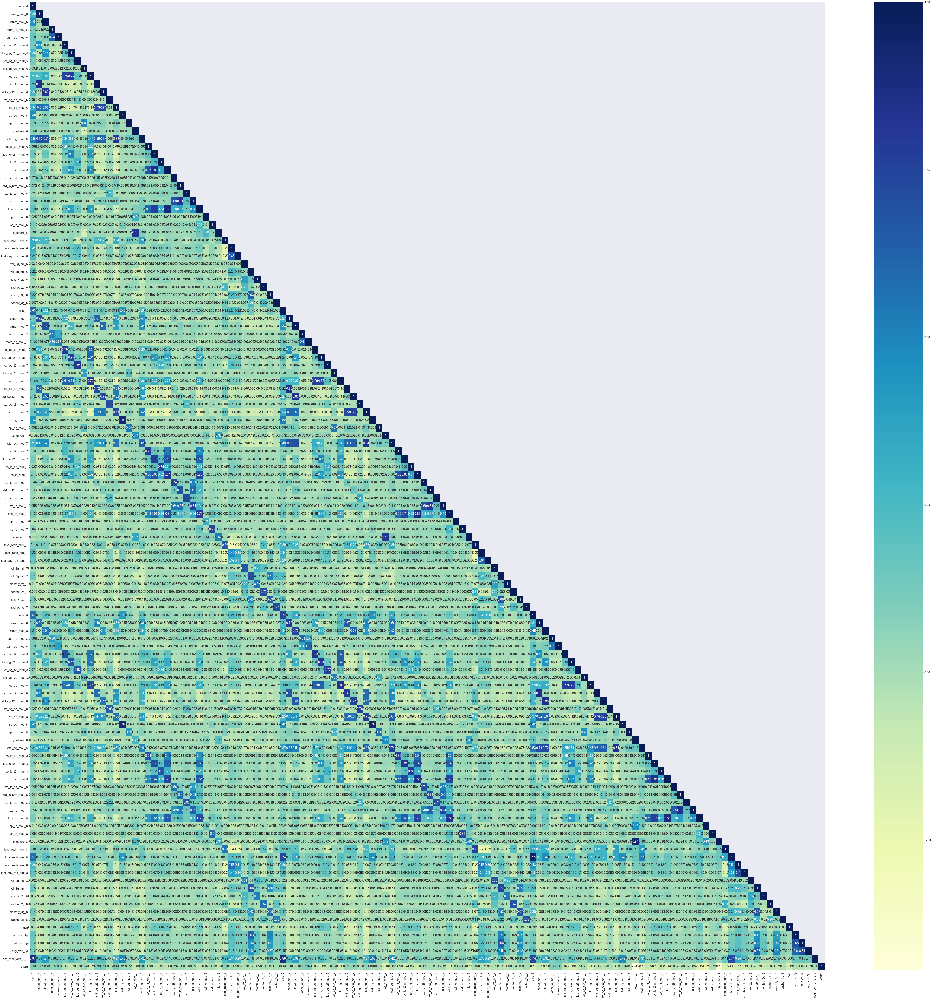

In [0]:
plt.figure(figsize=(100,100))
sns.set(font_scale=1.5)
sns.heatmap(df_lt, annot=True,cmap="YlGnBu")
plt.show()

In [0]:
#Find Highly correlated data
cor = df_678_HVC.corr()
cor.loc[:,:] = np.tril(cor, k=-1)
cor = cor.stack()
cor[(cor > 0.60) | (cor < -0.60)].sort_values(ascending=False)

total_rech_amt_8    arpu_8              0.953725
ic_others_8         og_others_8         0.942489
isd_og_mou_8        isd_og_mou_7        0.941386
                    isd_og_mou_6        0.916160
isd_og_mou_7        isd_og_mou_6        0.915040
total_ic_mou_6      loc_ic_mou_6        0.893417
avg_rech_amt_6_7    arpu_7              0.890903
total_ic_mou_8      loc_ic_mou_8        0.883512
total_ic_mou_7      loc_ic_mou_7        0.880740
avg_rech_amt_6_7    arpu_6              0.868980
std_og_t2t_mou_8    onnet_mou_8         0.856847
std_og_t2t_mou_7    onnet_mou_7         0.852901
loc_ic_mou_8        loc_ic_t2m_mou_8    0.851209
std_og_t2m_mou_7    offnet_mou_7        0.851145
loc_ic_mou_6        loc_ic_t2m_mou_6    0.851092
std_og_t2t_mou_6    onnet_mou_6         0.850830
std_og_t2m_mou_8    offnet_mou_8        0.848541
std_ic_mou_8        std_ic_t2m_mou_8    0.845656
total_og_mou_8      std_og_mou_8        0.838607
total_og_mou_7      std_og_mou_7        0.836178
ic_others_6         

In [0]:
df_678_HVC.shape

(30011, 124)

In [0]:
### Dropping highly correlated varibales
cols_to_drop = ['arpu_8','og_others_8','isd_og_mou_7','isd_og_mou_6','loc_ic_mou_6','arpu_7','loc_ic_mou_8',
'loc_ic_mou_7','arpu_6','onnet_mou_8','onnet_mou_7','offnet_mou_7','onnet_mou_6','offnet_mou_8',
'std_ic_t2m_mou_8','std_og_mou_8','std_og_mou_7','loc_ic_t2m_mou_7','loc_og_mou_7','loc_og_t2t_mou_7',
'offnet_mou_6','std_og_mou_6','std_ic_t2m_mou_6','std_ic_t2m_mou_7','loc_og_t2m_mou_7','total_ic_mou_7',
'loc_og_t2f_mou_6','std_og_t2t_mou_8','loc_ic_t2t_mou_7','loc_og_t2m_mou_6','loc_ic_t2f_mou_7','loc_og_t2f_mou_7',
'loc_og_t2m_mou_8','loc_og_t2t_mou_8','loc_ic_t2m_mou_6','std_og_t2f_mou_7','loc_ic_t2m_mou_8','std_og_t2m_mou_7',
'total_rech_num_7','loc_og_t2t_mou_6','offnet_mou_7','vol_3g_mb_7','total_og_mou_7','std_ic_t2t_mou_6','std_ic_mou_7',
'isd_ic_mou_6','isd_ic_mou_8','std_ic_t2f_mou_6','std_og_t2t_mou_6','offnet_mou_8','sachet_2g_6','total_rech_amt_8',
'loc_og_mou_6','std_ic_t2f_mou_7','jul_vbc_3g','sachet_3g_6','vol_3g_mb_6','std_ic_t2t_mou_7','loc_ic_mou_6','last_day_rch_amt_8',
'total_ic_mou_6','loc_ic_t2t_mou_6','std_ic_t2t_mou_6','sachet_3g_7','vol_2g_mb_7','sachet_2g_7','monthly_3g_7','loc_ic_t2f_mou_6',
'vol_3g_mb_8','ic_others_6','last_day_rch_amt_6','std_ic_t2t_mou_8','roam_ic_mou_6','std_og_t2m_mou_8','std_og_t2f_mou_6',  
'std_ic_mou_6','std_og_t2m_mou_6','roam_ic_mou_7','last_day_rch_amt_7']

df_678_HVC.drop(cols_to_drop,axis=1,inplace=True)
df_678_HVC.shape

(30011, 49)

### Outlier Analysis

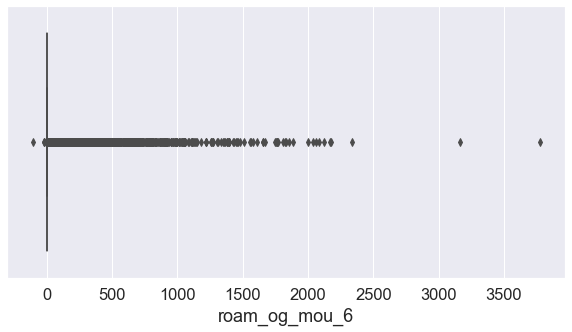

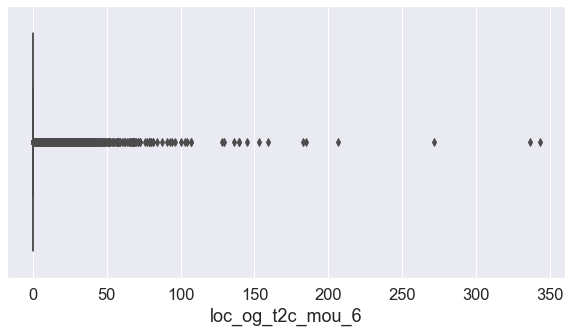

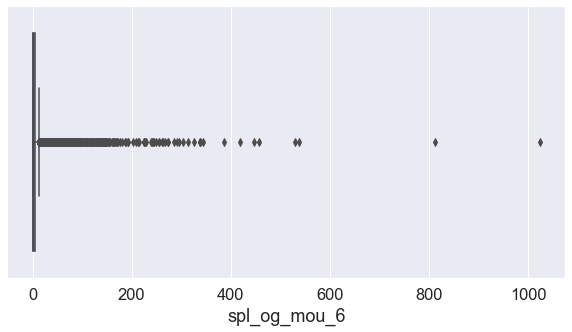

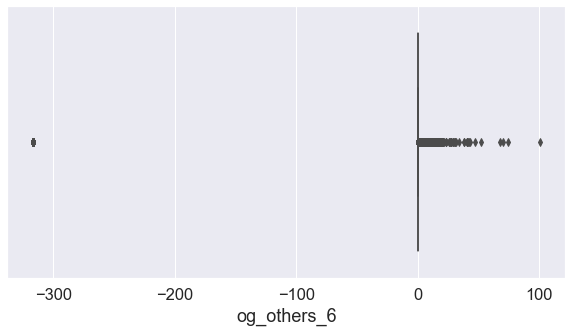

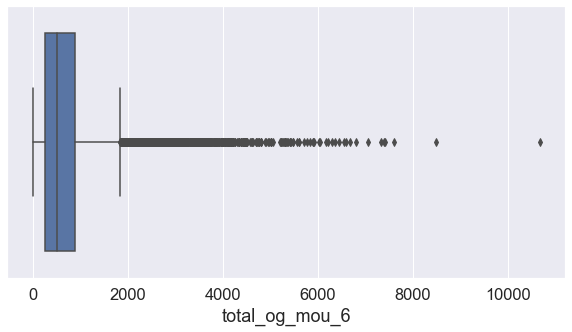

...

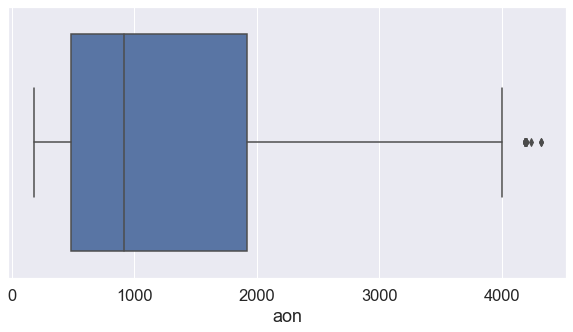

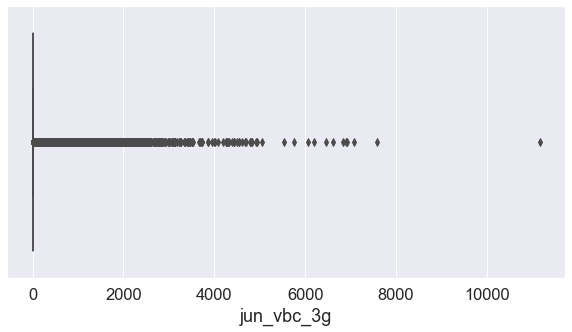

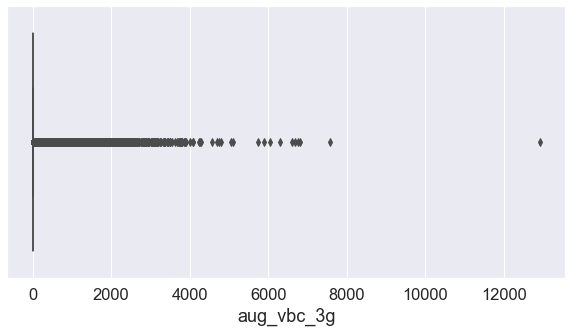

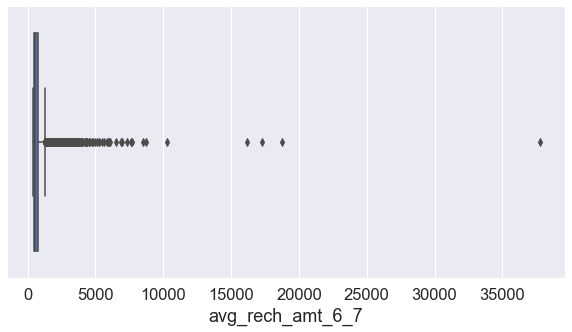

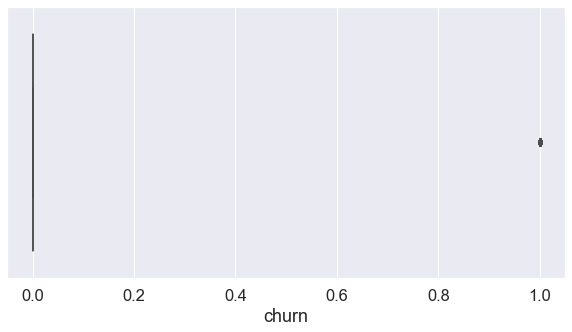

In [0]:
### Boxplot visualisation for identifying outliers

for col in list(df_678_HVC.columns):
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df_678_HVC[col])
    plt.show()

We could see there are outliers present in the dataset from the above boxplot

In [0]:
df_678_HVC.describe(percentiles=[.01,.05,.15,.25,.50,.75,.85,.90,.95,.97,.99])

,roam_og_mou_6,loc_og_t2c_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,spl_ic_mou_6,total_rech_num_6,max_rech_amt_6,vol_2g_mb_6,monthly_2g_6,monthly_3g_6,roam_og_mou_7,loc_og_t2c_mou_7,std_og_t2t_mou_7,spl_og_mou_7,og_others_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,max_rech_amt_7,monthly_2g_7,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,isd_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2f_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7,churn
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,29.598869,1.714817,5.957528,-2.646455,686.697541,0.061262,12.121322,171.414048,78.859009,0.124854,0.173903,22.227798,1.993311,200.718551,7.475488,-3.209911,0.018126,12.444329,-0.656112,175.661058,0.131352,14.308698,21.817893,6.608214,1.815339,265.649910,1.822979,2.054070,7.042427,623.774684,67.412707,15.070117,2.746903,49.208290,295.426531,0.017874,-5.282727,10.225317,162.869348,69.209105,0.114058,0.607611,0.173203,0.140415,1264.064776,121.360548,129.439626,696.664356,0.086402
std,118.540228,7.004813,18.612568,32.519555,660.356820,0.203182,9.543550,174.703215,277.445058,0.374512,0.574285,97.998895,9.328545,427.807689,23.054957,32.376959,0.181939,76.983292,26.263196,181.545389,0.387673,75.136826,106.336459,20.193370,7.416310,364.208903,11.696754,44.794016,22.862840,685.983313,155.293597,43.638537,20.264136,140.728813,360.343153,0.130763,38.731462,9.478572,172.605809,268.494284,0.357272,1.844444,0.582932,0.974727,975.263117,389.726031,390.478591,488.782088,0.280961
min,-109.020007,0.000000,0.000000,-317.159047,0.000000,-0.522199,0.000000,0.000000,0.000000,0.000000,0.000000,-70.822892,-15.262384,0.000000,0.000000,-322.659763,0.000000,0.000000,-211.280680,0.000000,0.000000,-293.358630,-52.317696,0.000000,-10.945149,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.314916,-208.639153,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,368.500000,0.000000
1%,0.000000,0.000000,0.000000,-317.098072,0.000000,-0.518617,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-322.628438,0.000000,0.000000,-211.252446,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.313287,-208.622068,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,189.000000,0.000000,0.000000,371.000000,0.000000
5%,0.000000,0.000000,0.000000,0.000000,20.525000,0.000000,3.000000,36.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,36.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,232.000000,0.000000,0.000000,381.250000,0.000000
15%,0.000000,0.000000,0.000000,0.000000,161.935000,0.000000,5.000000,67.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.970000,0.000000,0.000000,0.000000,81.385000,3.060000,0.000000,0.000000,0.2

### Outlier Treatment 

#### Capping and Removing outliers

In [0]:
df_678_HVC_copy = df_678_HVC.copy()

In [0]:
df_678_HVC.columns

Index(['roam_og_mou_6', 'loc_og_t2c_mou_6', 'spl_og_mou_6', 'og_others_6',
       'total_og_mou_6', 'spl_ic_mou_6', 'total_rech_num_6', 'max_rech_amt_6',
       'vol_2g_mb_6', 'monthly_2g_6', 'monthly_3g_6', 'roam_og_mou_7',
       'loc_og_t2c_mou_7', 'std_og_t2t_mou_7', 'spl_og_mou_7', 'og_others_7',
       'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'max_rech_amt_7',
       'monthly_2g_7', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2f_mou_8', 'isd_og_mou_8',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'vol_2g_mb_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'sachet_3g_8', 'aon', 'jun_vbc_3g', 'aug_vbc_3g',
       'avg_rech_amt_6_7', 'churn'],
      dtype='object')

In [0]:
for col in list(df_678_HVC.columns):
    df_678_HVC = df_678_HVC[df_678_HVC[col] <= np.percentile(df_678_HVC[col],99)]

In [0]:
df_678_HVC.shape

(19628, 49)

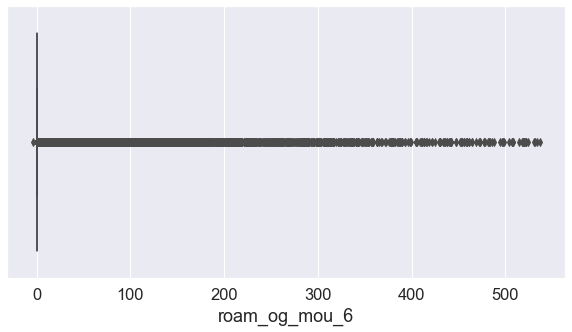

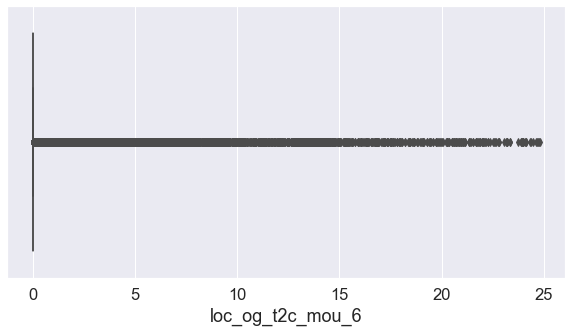

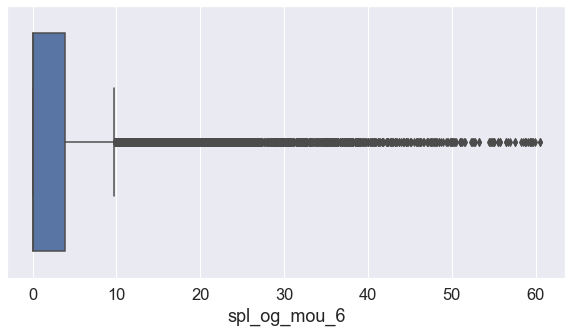

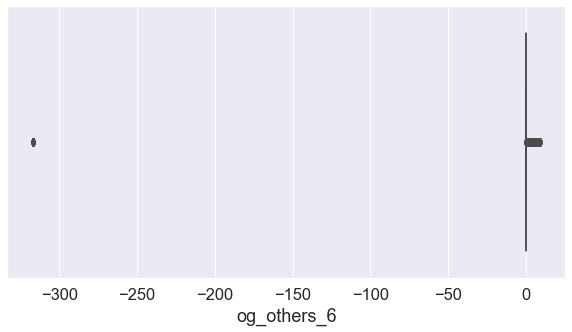

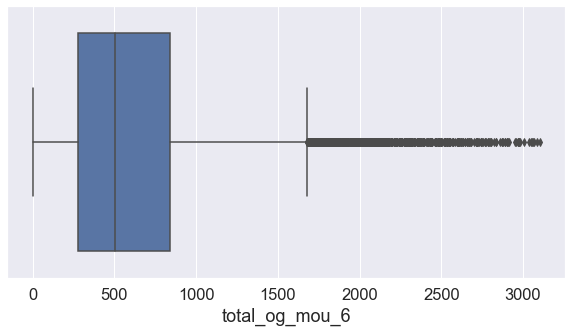

...

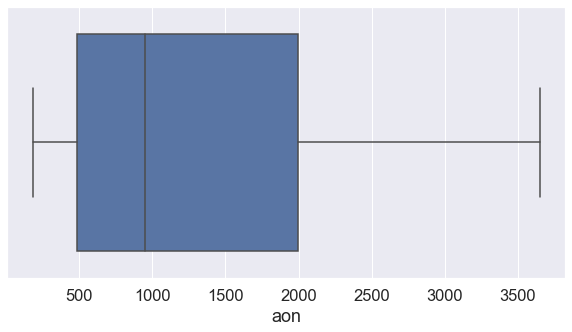

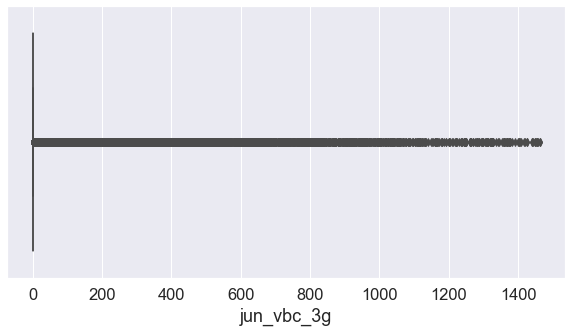

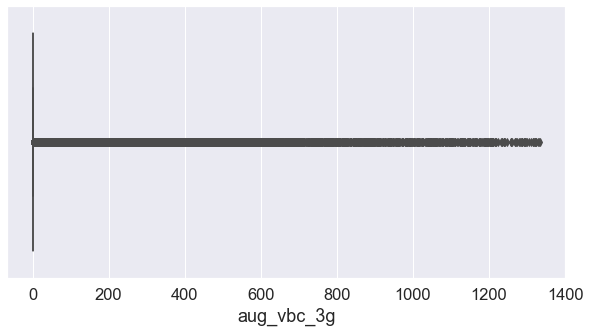

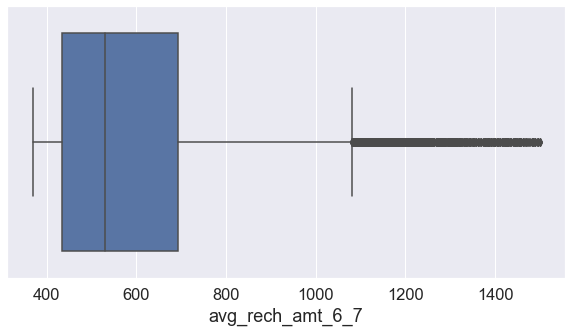

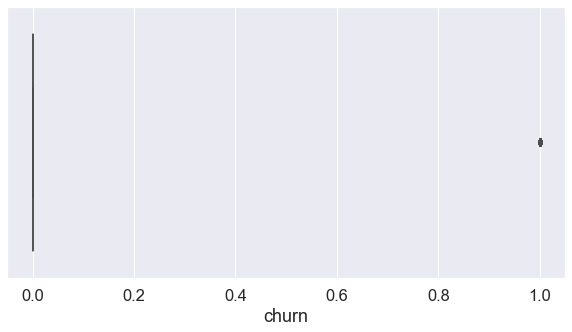

In [0]:
### Rechecking outlier
for col in list(df_678_HVC.columns):
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df_678_HVC[col])
    plt.show()

In [0]:
### Capping values for few cols with 5th percentile value
out_cols=['og_others_6','spl_ic_mou_6','og_others_7','ic_others_7','spl_ic_mou_8','ic_others_8']
for col in out_cols:
    df_678_HVC[col] = np.where(df_678_HVC[col] < df_678_HVC[col].quantile(0.05),df_678_HVC[col].quantile(0.05),df_678_HVC[col])

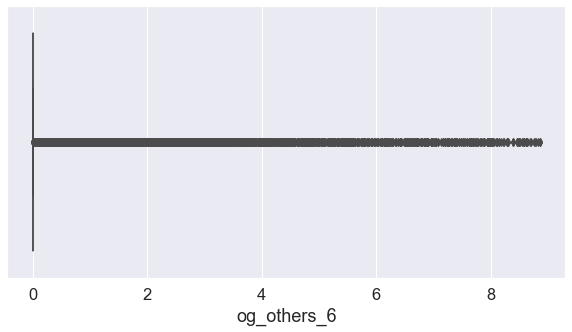

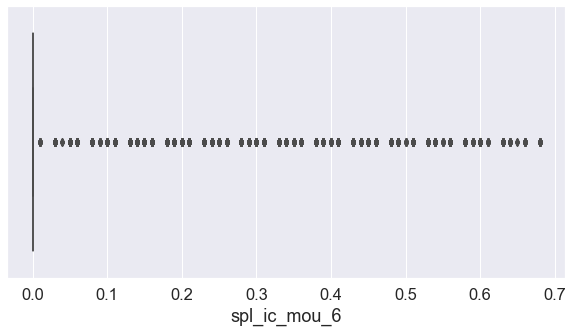

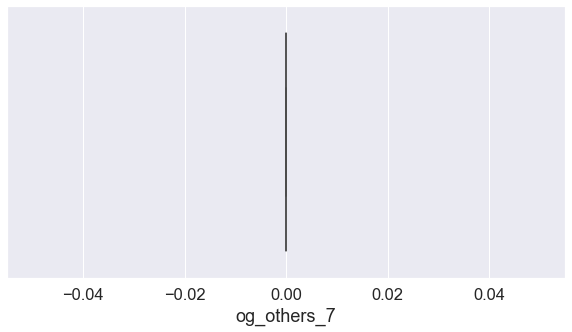

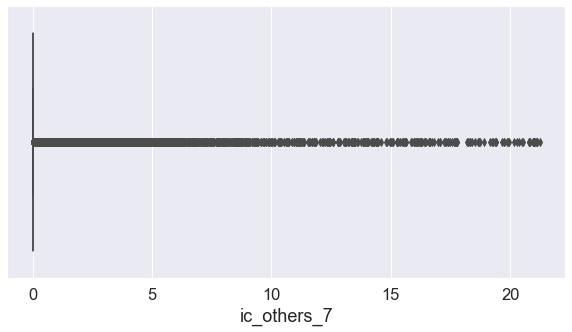

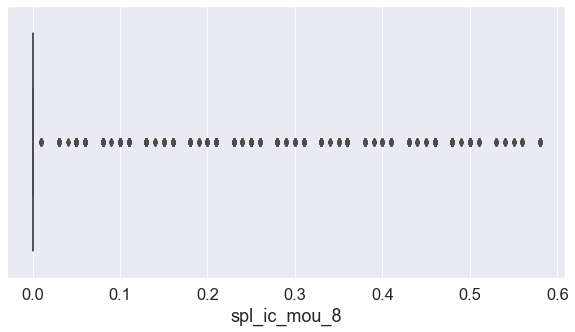

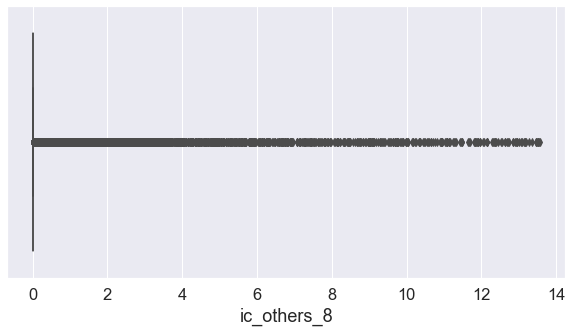

In [0]:
for col in out_cols:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=df_678_HVC[col])
    plt.show()

We could see outliers handled in most of the columns

### Bivariate Analysis - Continuous

In [0]:
def bivariate_continuos(df, target):
    
    cols = list(df.columns)
    
    for i in enumerate(cols):
        plt.figure(figsize=(10,90))
        plt.subplot(17,5,i[0]+1)
        sns.boxplot(x=target,y=i[1],data=df)
        plt.yscale('log')
        plt.show()

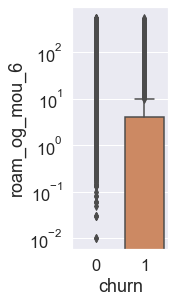

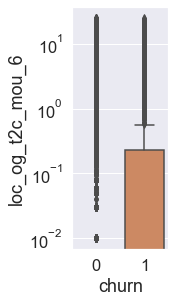

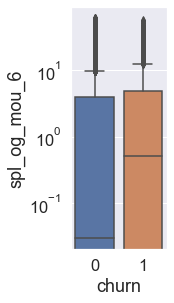

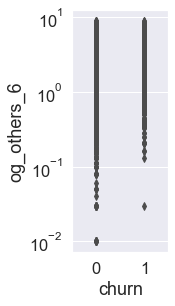

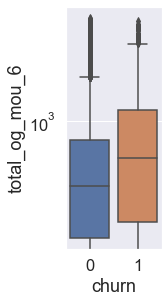

...

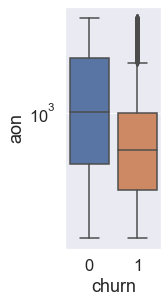

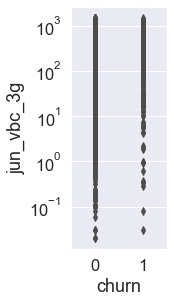

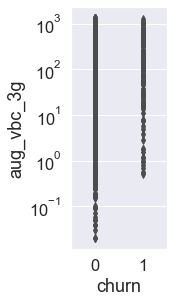

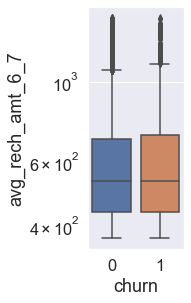

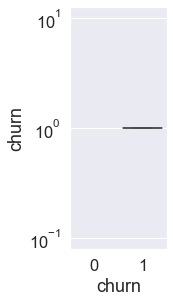

In [0]:
bivariate_continuos(df_678_HVC, 'churn')

### Train - Test Split

In [0]:
# Divide the data into train and test and X and y
X = df_678_HVC.drop(['churn'],axis=1)
y = df_678_HVC['churn']

In [0]:
# Splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, random_state= 100)

In [0]:
X_train.describe()

,roam_og_mou_6,loc_og_t2c_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,spl_ic_mou_6,total_rech_num_6,max_rech_amt_6,vol_2g_mb_6,monthly_2g_6,monthly_3g_6,roam_og_mou_7,loc_og_t2c_mou_7,std_og_t2t_mou_7,spl_og_mou_7,og_others_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,max_rech_amt_7,monthly_2g_7,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,isd_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2f_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7
count,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.0,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000,13739.000000
mean,17.740752,1.070822,3.649726,0.492890,620.664086,0.056811,11.055244,151.306281,48.997062,0.103210,0.120824,11.095608,1.131757,175.146056,4.434452,0.0,0.009471,5.360166,0.533314,152.958148,0.109033,5.925754,8.579098,4.712455,0.981611,229.794624,0.803913,0.156971,3.960752,528.663718,52.552722,10.764746,1.256028,32.912298,233.067881,0.018006,0.364438,8.877211,137.831283,36.231953,0.086542,0.471577,0.107723,0.059539,1285.875100,71.684379,73.464746,596.871788
std,57.554173,3.148829,7.312802,1.302953,484.065205,0.132307,7.171713,113.654269,152.633141,0.330174,0.401757,38.512685,3.199167,317.329409,7.846538,0.0,0.049073,20.784548,2.008859,115.789758,0.341128,19.319221,28.027966,10.315033,2.712723,250.394518,3.406258,1.114971,6.948366,464.445940,72.106857,20.943938,4.097459,56.312323,216.083752,0.077471,1.331851,7.038731,103.195678,119.546448,0.281173,1.267695,0.363233,0.312232,974.759263,205.452447,203.400475,214.192251
min,-4.271698,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-30.929351,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,-33.363363,-26.649964,0.000000,-1.626666,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,368.500000
25%,0.000000,0.000000,0.000000,0.000000,278.335000,0.000000,6.000000,110.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,110.000000,0.000000,0.000000,0.000000,0.000000,0.000000,47.920000,0.000000,0.000000,0.000000,183.960000,8.230000,0.000000,0.000000,1.980000,73.195000,0.000000,0.000000,4.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,485.000000,0.000000,0.000000,435.000000
50%,0.000000,0.000000,0.060000,0.000000,504.790000,0.000000,9.000000,110.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.310000,0.530000,0.0,0.000000,0.000000,0.000000,128.000000,0.000000,0.000000,0.000000,0.330000,0.000000,141.530000,0.000000,0.000000,0.440000,412.640000,29.030000,2.160000,0.000000,12.810000,176.840000,0.000000,0.000000,7.000000,130.000000,0.000000,0.000000,0.000000,0.000000,0.000000,942.000000,0.000000,0.000000,530.500000
75%,0.000000,0.000000,3.910000,0.000000,841.085000,0.000000,14.000000,155.000000,3.470000,0.000000,0.000000,0.000000,0.000000,190.785000,5.435000,0.0,0.000000,0.000000,0.000000,169.000000,0.000000,0.000000,0.000000,3.960000,0.050000,325.080000,0.000000,0.000000,5.030666,758.600000,64.645000,11.633027,0.280000,36.350000,328.795000,0.000000,0.000000,12.000000,154.000000,0.455000,0.000000,0.000000,0.000000,0.000000,1997.000000,0.00000

In [0]:
X_train.columns

Index(['roam_og_mou_6', 'loc_og_t2c_mou_6', 'spl_og_mou_6', 'og_others_6',
       'total_og_mou_6', 'spl_ic_mou_6', 'total_rech_num_6', 'max_rech_amt_6',
       'vol_2g_mb_6', 'monthly_2g_6', 'monthly_3g_6', 'roam_og_mou_7',
       'loc_og_t2c_mou_7', 'std_og_t2t_mou_7', 'spl_og_mou_7', 'og_others_7',
       'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'max_rech_amt_7',
       'monthly_2g_7', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2f_mou_8', 'isd_og_mou_8',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'vol_2g_mb_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'sachet_3g_8', 'aon', 'jun_vbc_3g', 'aug_vbc_3g',
       'avg_rech_amt_6_7'],
      dtype='object')

### Feature Scaling

In [0]:
## Scaling the train and test data
from sklearn.preprocessing import  StandardScaler
scaler = StandardScaler()
X_train[['roam_og_mou_6', 'loc_og_t2c_mou_6', 'spl_og_mou_6', 'og_others_6',
       'total_og_mou_6', 'spl_ic_mou_6', 'total_rech_num_6', 'max_rech_amt_6',
       'vol_2g_mb_6', 'monthly_2g_6', 'monthly_3g_6', 'roam_og_mou_7',
       'loc_og_t2c_mou_7', 'std_og_t2t_mou_7', 'spl_og_mou_7', 'og_others_7',
       'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'max_rech_amt_7',
       'monthly_2g_7', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2f_mou_8', 'isd_og_mou_8',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'vol_2g_mb_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'sachet_3g_8', 'aon', 'jun_vbc_3g', 'aug_vbc_3g',
       'avg_rech_amt_6_7']] = scaler.fit_transform(X_train[['roam_og_mou_6', 'loc_og_t2c_mou_6', 'spl_og_mou_6', 'og_others_6',
       'total_og_mou_6', 'spl_ic_mou_6', 'total_rech_num_6', 'max_rech_amt_6',
       'vol_2g_mb_6', 'monthly_2g_6', 'monthly_3g_6', 'roam_og_mou_7',
       'loc_og_t2c_mou_7', 'std_og_t2t_mou_7', 'spl_og_mou_7', 'og_others_7',
       'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'max_rech_amt_7',
       'monthly_2g_7', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2f_mou_8', 'isd_og_mou_8',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'vol_2g_mb_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'sachet_3g_8', 'aon', 'jun_vbc_3g', 'aug_vbc_3g',
       'avg_rech_amt_6_7']] )
X_test[['roam_og_mou_6', 'loc_og_t2c_mou_6', 'spl_og_mou_6', 'og_others_6',
       'total_og_mou_6', 'spl_ic_mou_6', 'total_rech_num_6', 'max_rech_amt_6',
       'vol_2g_mb_6', 'monthly_2g_6', 'monthly_3g_6', 'roam_og_mou_7',
       'loc_og_t2c_mou_7', 'std_og_t2t_mou_7', 'spl_og_mou_7', 'og_others_7',
       'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'max_rech_amt_7',
       'monthly_2g_7', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2f_mou_8', 'isd_og_mou_8',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'vol_2g_mb_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'sachet_3g_8', 'aon', 'jun_vbc_3g', 'aug_vbc_3g',
       'avg_rech_amt_6_7']] = scaler.transform(X_test[['roam_og_mou_6', 'loc_og_t2c_mou_6', 'spl_og_mou_6', 'og_others_6',
       'total_og_mou_6', 'spl_ic_mou_6', 'total_rech_num_6', 'max_rech_amt_6',
       'vol_2g_mb_6', 'monthly_2g_6', 'monthly_3g_6', 'roam_og_mou_7',
       'loc_og_t2c_mou_7', 'std_og_t2t_mou_7', 'spl_og_mou_7', 'og_others_7',
       'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'max_rech_amt_7',
       'monthly_2g_7', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2f_mou_8', 'isd_og_mou_8',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'vol_2g_mb_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'sachet_3g_8', 'aon', 'jun_vbc_3g', 'aug_vbc_3g',
       'avg_rech_amt_6_7']] )

In [0]:
X_train.head()

,roam_og_mou_6,loc_og_t2c_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,spl_ic_mou_6,total_rech_num_6,max_rech_amt_6,vol_2g_mb_6,monthly_2g_6,monthly_3g_6,roam_og_mou_7,loc_og_t2c_mou_7,std_og_t2t_mou_7,spl_og_mou_7,og_others_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,max_rech_amt_7,monthly_2g_7,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,isd_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2f_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7
76957,-0.308256,0.584105,-0.101159,-0.37830,-0.158051,-0.429401,-0.286587,-0.741805,-0.321024,-0.312603,-0.30075,-0.288113,0.640266,1.771864,-0.054096,0.0,-0.193006,-0.257901,-0.265491,-0.742391,-0.319635,-0.306740,-0.306102,-0.031262,3.217692,-0.403636,-0.236019,-0.14079,1.096592,0.650856,-0.559228,0.383192,-0.30655,-0.576845,-0.338020,-0.232436,3.563262,0.585750,-0.075890,-0.303089,-0.3078,0.416853,-0.296576,-0.190694,-0.103491,-0.348923,-0.361196,-0.681057
62793,-0.307734,-0.340082,-0.447140,-0.37830,2.997011,0.931125,0.410622,0.868400,-0.321024,-0.312603,-0.30075,-0.288113,-0.353779,0.130828,-0.565168,0.0,-0.193006,1.561305,8.013143,-0.889214,-0.319635,-0.306740,-0.306102,-0.456870,-0.361868,-0.917764,-0.236019,-0.14079,-0.565729,-1.138244,-0.307509,-0.238968,-0.30655,0.071527,-0.360651,-0.232436,5.590590,-0.835012,-1.335679,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,0.327400,-0.348923,-0.361196,0.147668
50157,-0.308256,-0.276564,-0.471755,-0.37830,0.336219,-0.429401,1.805040,-0.706610,-0.254981,-0.312603,-0.30075,-0.025593,-0.353779,-0.088731,-0.565168,0.0,-0.193006,-0.257901,-0.265491,-1.010127,-0.319635,-0.306740,-0.306102,-0.456870,-0.361868,-0.839724,-0.236019,-0.14079,-0.558533,-0.346950,-0.608046,-0.513998,-0.30655,-0.534579,-0.963448,5.963664,-0.273643,1.154055,-0.928670,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,-0.534382,0.428999,-0.361196,-0.797779
58674,-0.308256,-0.340082,-0.343209,-0.37830,0.145742,-0.429401,-0.565470,-0.363451,-0.321024,-0.312603,-0.30075,-0.288113,-0.353779,-0.312104,-0.372720,0.0,-0.193006,-0.257901,-0.265491,-0.371015,-0.319635,0.087183,0.013591,-0.456870,0.025211,-0.917764,-0.236019,-0.14079,-0.570047,-1.138309,-0.717610,-0.513998,-0.30655,-0.584481,-1.061932,-0.232436,-0.273643,-0.692936,-0.075890,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,-0.467697,-0.348923,-0.361196,-0.662381
71723,-0.308256,-0.340082,-0.356884,0.15896,-0.329212,-0.429401,-0.426029,-0.363451,-0.321024,-0.312603,-0.30075,-0.288113,-0.353779,-0.216553,-0.421150,0.0,-0.193006,-0.257901,-0.265491,-0.371015,-0.319635,-0.306740,-0.306102,-0.131120,-0.313944,0.474410,-0.236019,-0.14079,-0.427562,-0.217415,-0.325539,-0.513998,-0.30655,-0.254346,-0.084960,-0.232436,-0.273643,-0.550860,-0.075890,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,0.043217,-0.348923,-0.361196,-0.452282


In [0]:
X_test.head()

,roam_og_mou_6,loc_og_t2c_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,spl_ic_mou_6,total_rech_num_6,max_rech_amt_6,vol_2g_mb_6,monthly_2g_6,monthly_3g_6,roam_og_mou_7,loc_og_t2c_mou_7,std_og_t2t_mou_7,spl_og_mou_7,og_others_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,max_rech_amt_7,monthly_2g_7,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,isd_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2f_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,jun_vbc_3g,aug_vbc_3g,avg_rech_amt_6_7
67921,-0.308256,-0.340082,-0.499105,-0.378300,-0.295888,-0.429401,-0.147145,-1.067366,-0.321024,-0.312603,-0.30075,-0.288113,-0.353779,1.451900,-0.565168,0.0,-0.193006,-0.257901,-0.265491,-0.198282,-0.319635,-0.205283,-0.265070,-0.45687,-0.361868,-0.767076,-0.236019,-0.14079,-0.570047,0.867401,-0.441898,-0.513998,-0.306550,-0.273881,-0.512218,-0.232436,-0.273643,0.159522,-0.075890,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,-0.990922,-0.348923,-0.361196,-0.891156
91663,-0.308256,2.880280,0.887555,-0.293874,2.832358,-0.429401,0.271180,-0.205070,0.317065,-0.312603,-0.30075,-0.288113,-0.353779,-0.551958,0.664718,0.0,-0.193006,-0.257901,0.058088,-0.474655,2.611921,-0.306740,-0.306102,-0.45687,6.841490,3.888786,-0.218404,-0.14079,2.242227,1.495269,-0.417073,-0.513998,0.196219,-0.520372,-0.789019,-0.232436,-0.115962,0.727827,0.059779,2.490654,-0.3078,1.205715,-0.296576,-0.190694,-0.338429,-0.348923,2.873477,-0.372911
90171,-0.308256,-0.340082,-0.499105,-0.378300,0.874864,-0.429401,-0.565470,1.528320,0.250433,2.716211,-0.30075,-0.288113,-0.353779,-0.551958,-0.565168,0.0,-0.193006,8.703890,-0.265491,0.008998,2.611921,-0.306740,-0.306102,-0.45687,0.497079,2.911892,-0.236019,-0.14079,-0.067752,0.933891,6.880834,-0.376483,-0.055165,-0.566190,3.341614,-0.232436,-0.273643,-0.266707,0.602457,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,1.631359,2.108573,3.918153,-0.526984
74004,-0.308256,-0.340082,-0.371926,-0.378300,-0.239035,-0.429401,-0.704912,-0.363451,-0.321024,-0.312603,-0.30075,-0.288113,-0.303764,2.336124,-0.544776,0.0,-0.193006,-0.257901,-0.265491,-0.371015,-0.319635,-0.306740,-0.306102,-0.45687,-0.361868,-0.917524,-0.236019,-0.14079,-0.570047,-1.110124,-0.724961,-0.513998,-0.306550,-0.584481,-1.062950,-0.232436,-0.273643,-0.835012,-1.044959,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,-0.678013,-0.348923,-0.361196,-1.021885
61303,-0.308256,-0.340082,-0.499105,-0.378300,1.509926,-0.429401,0.271180,-0.363451,-0.321024,-0.312603,-0.30075,0.381301,-0.353779,1.097524,-0.565168,0.0,-0.193006,-0.253090,-0.265491,-0.371015,-0.319635,1.168011,0.762869,-0.45687,-0.361868,-0.917764,-0.236019,-0.14079,-0.570047,-1.138309,-0.728844,-0.513998,-0.306550,-0.584481,-1.078639,-0.232436,-0.273643,-1.119164,-0.075890,-0.303089,-0.3078,-0.372009,-0.296576,-0.190694,-0.289185,-0.348923,-0.361196,0.925035


### Class Imbalance

In [0]:
# Class_Balance
100*y_train.value_counts(normalize=True)

0    90.719849
1     9.280151
Name: churn, dtype: float64

Here we could see that the data is imbalanced and hence we need to handle this while building the model

### Model Building

### Logistic Regression without PCA

In [0]:
### Logistic regression with class weight balanced
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(random_state=0,class_weight='balanced')

#### RFE - Feature Selection

In [0]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)

In [0]:
col = X_train.columns[rfe.support_]
col

Index(['roam_ic_mou_8', 'loc_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'std_ic_t2f_mou_8', 'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8',
       'total_rech_num_8', 'max_rech_amt_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'aon', 'avg_rech_amt_6_7'],
      dtype='object')

#### Assessing with stats model

In [0]:
import statsmodels.api as sm
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                13739
Model:                            GLM   Df Residuals:                    13723
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2701.6
Date:                Mon, 18 May 2020   Deviance:                       5403.3
Time:                        19:14:20   Pearson chi2:                 3.04e+05
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -3.8773      0.079    -48.830      0.000      -4.033      -3.722
roam_ic_mou_8        0.2079      0.028      7.468      0.000       0.153       0.262
loc_og_mou_8        -0.0773      0.084     -0.924      0.355      -0.241       0.087
total_og_mou_8      -0.6455      0.068     -9.511      0.000      -0.779      -0.512
loc_ic_t2t_mou_8     0.7186      0.082      8.749      0.000       0.558       0.880
std_ic_t2f_mou_8    -0.1363      0.070     -1.936      0.053      -0.274       0.002
std_ic_mou_8         0.5116      0.061      8.334      0.000       0.391       0.632
total_ic_mou_8      -2.1965      0.136    -16.142      0.000      -2.463      -1.930
spl_ic_mou_8        -0.4609      0.095     -4.836      0.000      -0.648      -0.274
total_rech_num_8    -0.3153      0.058     -5.477      0.000      -0.428      -0.202
max_rech_amt_8      -0.3900      0.056     -7.015      0.000      -0.499      -0.281
monthly_2g_8        -0.4299      0.079     -5.466      0.000      -0.584      -0.276
sachet_2g_8         -0.2668      0.063     -4.206      0.000      -0.391      -0.142
monthly_3g_8        -0.4019      0.071     -5.688      0.000      -0.540      -0.263
aon                 -0.3232      0.048     -6.757      0.000      -0.417      -0.229
avg_rech_amt_6_7     0.4169      0.039     10.817      0.000       0.341       0.492
====================================================================================
"""

Here P values are also significant

In [0]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

76957    0.012117
62793    0.216202
50157    0.008460
58674    0.286420
71723    0.028904
31721    0.002066
50150    0.003132
67496    0.007995
4634     0.393793
73748    0.009891
dtype: float64

In [0]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.01211722, 0.2162023 , 0.00846031, 0.28641974, 0.02890423,
       0.00206615, 0.00313197, 0.00799458, 0.3937932 , 0.00989132])

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [0]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
#y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob
0,0,0.012117
1,0,0.216202
2,0,0.008460
3,1,0.286420
4,0,0.028904


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [0]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.012117,0
1,0,0.216202,0
2,0,0.008460,0
3,1,0.286420,0
4,0,0.028904,0


In [0]:
from sklearn import metrics

In [0]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[12282   182]
 [  776   499]]


In [0]:
# Predicted     not_churn    churn
# Actual
# not_churn        18905      279
# churn            1133       690  

In [0]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.930271489919208


#### Checking VIF

In [0]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [0]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,total_ic_mou_8,2.69
1,loc_og_mou_8,1.87
2,total_og_mou_8,1.80
3,loc_ic_t2t_mou_8,1.77
8,total_rech_num_8,1.51
9,max_rech_amt_8,1.51
5,std_ic_mou_8,1.34
12,monthly_3g_8,1.23
14,avg_rech_amt_6_7,1.23
13,aon,1.16


Here we could see P values is high for Loc_og_mou_8 indicating that the variable is not significant in predicting and hence we can drop them and rebuild the model.
However , VIF values are less than 5 which means there is no mutlicollinearity among the variables i.e., good VIF's

In [0]:
col = col.drop('loc_og_mou_8', 1)
col

Index(['roam_ic_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'std_ic_t2f_mou_8', 'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8',
       'total_rech_num_8', 'max_rech_amt_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'aon', 'avg_rech_amt_6_7'],
      dtype='object')

In [0]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                13739
Model:                            GLM   Df Residuals:                    13724
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2702.1
Date:                Mon, 18 May 2020   Deviance:                       5404.2
Time:                        19:14:24   Pearson chi2:                 3.21e+05
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -3.8672      0.078    -49.420      0.000      -4.021      -3.714
roam_ic_mou_8        0.2069      0.028      7.433      0.000       0.152       0.261
total_og_mou_8      -0.6582      0.067     -9.836      0.000      -0.789      -0.527
loc_ic_t2t_mou_8     0.7029      0.081      8.668      0.000       0.544       0.862
std_ic_t2f_mou_8    -0.1438      0.071     -2.029      0.042      -0.283      -0.005
std_ic_mou_8         0.5212      0.061      8.610      0.000       0.403       0.640
total_ic_mou_8      -2.2229      0.133    -16.706      0.000      -2.484      -1.962
spl_ic_mou_8        -0.4603      0.095     -4.827      0.000      -0.647      -0.273
total_rech_num_8    -0.3123      0.057     -5.438      0.000      -0.425      -0.200
max_rech_amt_8      -0.3913      0.056     -7.044      0.000      -0.500      -0.282
monthly_2g_8        -0.4288      0.079     -5.456      0.000      -0.583      -0.275
sachet_2g_8         -0.2681      0.063     -4.228      0.000      -0.392      -0.144
monthly_3g_8        -0.4023      0.071     -5.691      0.000      -0.541      -0.264
aon                 -0.3272      0.048     -6.870      0.000      -0.421      -0.234
avg_rech_amt_6_7     0.4159      0.038     10.804      0.000       0.340       0.491
====================================================================================
"""

In [0]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred[:10]

array([0.01196787, 0.21102783, 0.00840342, 0.28442052, 0.03051679,
       0.00188609, 0.0030003 , 0.00837719, 0.39220112, 0.00985832])

In [0]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [0]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.011968,0
1,0,0.211028,0
2,0,0.008403,0
3,1,0.284421,0
4,0,0.030517,0


In [0]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9303442754203363


In [0]:
### Let us checkthe VIF again
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,total_ic_mou_8,2.26
2,loc_ic_t2t_mou_8,1.75
1,total_og_mou_8,1.67
7,total_rech_num_8,1.51
8,max_rech_amt_8,1.51
4,std_ic_mou_8,1.24
11,monthly_3g_8,1.23
13,avg_rech_amt_6_7,1.22
12,aon,1.15
10,sachet_2g_8,1.09


Now the P value and VIF values are within the range

In [0]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
confusion

array([[12284,   180],
       [  777,   498]], dtype=int64)

In [0]:
# Predicted     not_churn    churn
# Actual
# not_churn        499      1
# churn            20       25 

In [0]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted)

0.9303442754203363

#### Metrics beyond Accuracy

Accuracy alone is not enough to assess the goodness of the model.

Metrics to evaluate a classification model :

1. **Sensitivity** - Proportion of yes correctly predicted by the model as yes
2. **Specificity** - Proportion of No correctly predicted by the model as No

In [0]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

#### Sensitivity

In [0]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.3905882352941176

#### Specificity

In [0]:
# Let us calculate specificity
TN / float(TN+FP)

0.9855584082156611

In [0]:
# Calculate false postive rate - predicting Converted when customer does not Converted
print(FP/ float(TN+FP))

0.014441591784338896


In [0]:
# positive predictive value 
print (TP / float(TP+FP))

0.7345132743362832


In [0]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9405099150141643


#### Plotting the ROC Curve

ROC curve shows trade off between True Positive Rate (TPR) and False positive Rate (FPR)

TPR = Sensitivity

FPR = (1-Specificity)

Good ROC curve is the one which hugs the upper left corner of the graph where FPR is almost low and TPR is almost high.

So, if higher the area under an ROC curve, better is your model

In [0]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [0]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

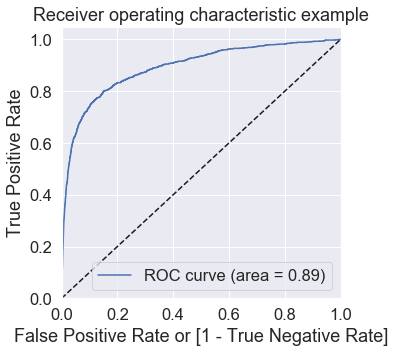

In [0]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

**Inference** - Here the curve hugs the upper right corner very well and the area under the curve is also high **0.89** . Hence our model is a good model.

#### Finding the optimal threshold

In [0]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.011968,0,1,0,0,0,0,0,0,0,0,0
1,0,0.211028,0,1,1,1,0,0,0,0,0,0,0
2,0,0.008403,0,1,0,0,0,0,0,0,0,0,0
3,1,0.284421,0,1,1,1,0,0,0,0,0,0,0
4,0,0.030517,0,1,0,0,0,0,0,0,0,0,0


In [0]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.092802  1.000000  0.000000
0.1   0.1  0.831720  0.806275  0.834323
0.2   0.2  0.902249  0.706667  0.922256
0.3   0.3  0.923721  0.621961  0.954589
0.4   0.4  0.930927  0.519216  0.973042
0.5   0.5  0.930344  0.390588  0.985558
0.6   0.6  0.927724  0.307451  0.991175
0.7   0.7  0.918116  0.152941  0.996390
0.8   0.8  0.910255  0.041569  0.999117
0.9   0.9  0.907854  0.007843  0.999920


<Figure size 2160x720 with 0 Axes>

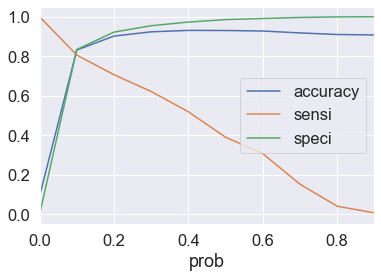

In [0]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
plt.figure(figsize=(30,10))
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
#plt.xticks(np.arange(0, 1, step=0.05),size = 10)
plt.grid(True)
plt.show()

**Inference** - At threshold of **0.1** , the curves of accuracy,sensitivity,specificity intersect and they all take a value of around **80%**. So we are choosing **0.1** as the optimal cut off point

In [0]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.011968,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.211028,0,1,1,1,0,0,0,0,0,0,0,1
2,0,0.008403,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.284421,0,1,1,1,0,0,0,0,0,0,0,1
4,0,0.030517,0,1,0,0,0,0,0,0,0,0,0,0


In [0]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.8317199213916587

In [0]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion2

array([[10399,  2065],
       [  247,  1028]], dtype=int64)

In [0]:
# Predicted     not_churn    churn
# Actual
# not_churn        16513      2671
# churn            370       1453 

In [0]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [0]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8062745098039216

In [0]:
# Let us calculate specificity
TN / float(TN+FP)

0.8343228498074454

In [0]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.16567715019255455


In [0]:
# Positive predictive value 
print (TP / float(TP+FP))

0.33236340122858066


In [0]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9767987976704866


#### Precision and Recall

Precision and Recall are metrics very similar to sensitivity and specificity.

**Precision** - Probability that a predicted yes is actually a yes

**Recall** - Probability that an actual yes case is predicted correctly

##### Precision
TP / TP + FP

In [0]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.7345132743362832

##### Recall
TP / TP + FN

In [0]:
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.3905882352941176

#### Precision and recall tradeoff

In [0]:
from sklearn.metrics import precision_recall_curve

In [0]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

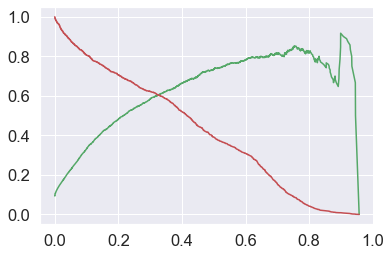

In [0]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

#### Caculating F-score

F-score is the hormonic mean of the precision and recall which is often used as an aggregated performance score for the evaluation of algorithms.

In [0]:
Precision = confusion[1,1]/(confusion[0,1]+confusion[1,1])
Recall = confusion[1,1]/(confusion[1,0]+confusion[1,1])
F_score = 2*(Precision*Recall)/(Precision+Recall)
F_score

0.5099846390168971

#### Making predictions on the test set

In [0]:
X_test1 = X_test[col]
X_test1.head()

,roam_ic_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,total_rech_num_8,max_rech_amt_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,aon,avg_rech_amt_6_7
67921,-0.205283,0.867401,-0.441898,-0.306550,-0.273881,-0.512218,-0.232436,0.159522,-0.075890,-0.3078,-0.372009,-0.296576,-0.990922,-0.891156
91663,-0.306740,1.495269,-0.417073,0.196219,-0.520372,-0.789019,-0.232436,0.727827,0.059779,-0.3078,1.205715,-0.296576,-0.338429,-0.372911
90171,-0.306740,0.933891,6.880834,-0.055165,-0.566190,3.341614,-0.232436,-0.266707,0.602457,-0.3078,-0.372009,-0.296576,1.631359,-0.526984
74004,-0.306740,-1.110124,-0.724961,-0.306550,-0.584481,-1.062950,-0.232436,-0.835012,-1.044959,-0.3078,-0.372009,-0.296576,-0.678013,-1.021885
61303,1.168011,-1.138309,-0.728844,-0.306550,-0.584481,-1.078639,-0.232436,-1.119164,-0.075890,-0.3078,-0.372009,-0.296576,-0.289185,0.925035


In [0]:
X_test_sm = sm.add_constant(X_test1)

In [0]:
y_test_pred = res.predict(X_test_sm)

In [0]:
y_test_pred[:10]

67921    0.033576
91663    0.017746
90171    0.000381
74004    0.335666
61303    0.516257
87438    0.108135
26268    0.089836
83369    0.082670
64811    0.016942
4370     0.077612
dtype: float64

In [0]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [0]:
# Let's see the head
y_pred_1.head()

,0
67921,0.033576
91663,0.017746
90171,0.000381
74004,0.335666
61303,0.516257


In [0]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [0]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [0]:
y_pred_final.head()

,churn,0
67921,1,0.033576
91663,0,0.017746
90171,0,0.000381
74004,1,0.335666
61303,0,0.516257


In [0]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [0]:
# Let's see the head of y_pred_final
y_pred_final.head()

,churn,Churn_Prob
67921,1,0.033576
91663,0,0.017746
90171,0,0.000381
74004,1,0.335666
61303,0,0.516257


#### Using the same threshold for the test data set

In [0]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [0]:
y_pred_final.head()

,churn,Churn_Prob,final_predicted
67921,1,0.033576,0
91663,0,0.017746,0
90171,0,0.000381,0
74004,1,0.335666,1
61303,0,0.516257,1


#### Accuracy

In [0]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.churn, y_pred_final.final_predicted)

0.8323993886907795

#### Confusion matrix

In [0]:
# Confusion matrix
confusion2 = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.final_predicted )
confusion2

array([[4476,  881],
       [ 106,  426]], dtype=int64)

In [0]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [0]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8007518796992481

In [0]:
# Let us calculate specificity
TN / float(TN+FP)

0.8355422811274967

In [0]:
### False positive rate
print(FP/ float(TN+FP))

0.16445771887250327


In [0]:
### Positive predicted value
print (TP / float(TP+FP))

0.3259372609028309


In [0]:
### Negative predicted value
print (TN / float(TN+ FN))

0.9768659973810563


In [0]:
### Precision
print(confusion2[1,1]/(confusion2[0,1]+confusion2[1,1]))

0.3259372609028309


In [0]:
### Recall
print(confusion2[1,1]/(confusion2[1,0]+confusion2[1,1]))

0.8007518796992481


In [0]:
### F-Score
Precision=confusion2[1,1]/(confusion2[0,1]+confusion2[1,1])
Recall = confusion2[1,1]/(confusion2[1,0]+confusion2[1,1])
F_score = 2*(Precision*Recall)/(Precision+Recall)
F_score

0.46329526916802605

In [0]:
### ROC CURVE

fpr, tpr, thresholds = metrics.roc_curve( y_pred_final.churn, y_pred_final.Churn_Prob)

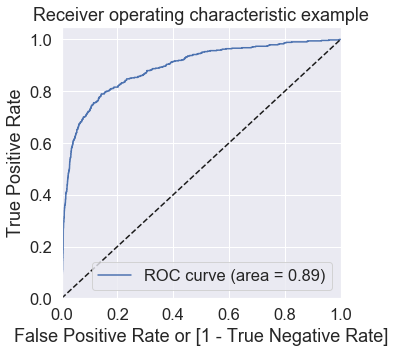

In [0]:
draw_roc(y_pred_final.churn, y_pred_final.Churn_Prob)

#### Features and their coefficients from the final model

#### Coef
A regression coefficient describes the size and direction of the relationship between a predictor and the response variable.

**Positive Coefficient** - Makes the event more likely

**Negative Coefficient** - Makes the event less likely

**Coefficient near zero** - Makes the effect of the predictor is small

In [0]:
final_params = res.params[1:]
final_params.sort_values(ascending=False,inplace=True)
final_params

loc_ic_t2t_mou_8    0.702941
std_ic_mou_8        0.521242
avg_rech_amt_6_7    0.415857
roam_ic_mou_8       0.206869
std_ic_t2f_mou_8   -0.143810
sachet_2g_8        -0.268127
total_rech_num_8   -0.312331
aon                -0.327175
max_rech_amt_8     -0.391338
monthly_3g_8       -0.402272
monthly_2g_8       -0.428808
spl_ic_mou_8       -0.460311
total_og_mou_8     -0.658219
total_ic_mou_8     -2.222919
dtype: float64

### Conclusion on Logistic Regression:

#### Evaluation metric Results

#### TRAIN Results
        
        Accuracy - 83.17 
        Sensitivity - 80.62
        Specificity - 83.43
        
#### TEST Results
    
        Accuracy - 83.24
        Sensitivity - 80.07
        Specificity - 83.55
        
#### Strong predictors of Churn    

The churning probability of a high value customer **increases** with increase in value of the following predictors.
    
loc_ic_t2t_mou_8<br/>
std_ic_mou_8<br/>
avg_rech_amt_6_7<br/>
roam_ic_mou_8<br/>

The churning probability of a high value customer **decreases** with increase in value of the following predictors.

std_ic_t2f_mou_8<br/>
sachet_2g_8<br/>
total_rech_num_8<br/>
aon<br/>
max_rech_amt_8<br/>
monthly_3g_8<br/>
monthly_2g_8<br/>
spl_ic_mou_8<br/>
total_og_mou_8<br/>
total_ic_mou_8<br/>

### Visualizing the significant predictors of churn

<Figure size 864x576 with 0 Axes>

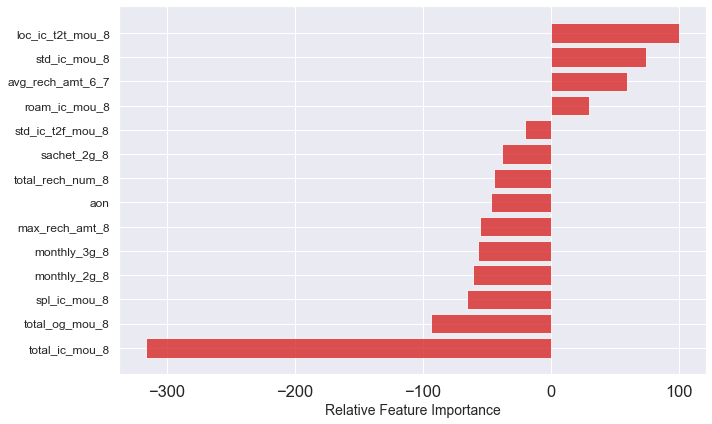

In [0]:
#Selecting the coefficients of the selected features from our final model excluding the intercept
pd.options.display.float_format = '{:.2f}'.format
new_params = res.params[1:]
new_params




#Getting a relative coeffient value for all the features wrt the feature with the highest coefficient
feature_importance = new_params
feature_importance = 100.0 * (feature_importance / feature_importance.max())
feature_importance



#Sorting the feature variables based on their relative coefficient values
sorted_idx = np.argsort(feature_importance,kind='quicksort',order='list of str')
sorted_idx


#Plot showing the feature variables based on their relative coefficient values
#Plotting the scree plot
%matplotlib inline
fig = plt.figure(figsize = (12,8))
pos = np.arange(sorted_idx.shape[0]) + .5

featfig = plt.figure(figsize=(10,6))
featax = featfig.add_subplot(1, 1, 1)
featax.barh(pos, feature_importance[sorted_idx], align='center', color = 'tab:red',alpha=0.8)
featax.set_yticks(pos)
featax.set_yticklabels(np.array(X_train[col].columns)[sorted_idx], fontsize=12)
featax.set_xlabel('Relative Feature Importance', fontsize=14)

plt.tight_layout()   
plt.show()

1. The incoming and outgoing calls in month 8 is most importat predictor of churn
2. When age on network increases the customer churning probability decreases i.e., Long term customers have less probability to churn
3. If we could see high recharge amount in month 6 & 7 and there is drop in the recharge amount in month 8 then that customer has the possibility of churning
4. If the cutomer has taken any monthly checmes in the month of 8 then the customer has less probability to churn.
5. In month 8, if there is only incoming calls and there is no outgoing calls then there is a probability that the cutomer will churn.

## PCA

In [0]:
X_train.shape

(13739, 48)

In [0]:
from sklearn.decomposition import PCA
pca = PCA(random_state=42)
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [0]:
pca.components_

array([[-2.43610936e-03, -8.15631705e-03, -6.15506161e-02, ...,
         2.35183942e-01,  2.51736520e-01,  4.06954962e-02],
       [-4.28867516e-02,  4.42718872e-02,  1.21929251e-01, ...,
        -5.07096109e-02, -1.88488347e-02,  2.83570009e-01],
       [-3.75953557e-02,  2.16420098e-01,  2.62164857e-01, ...,
         2.23146660e-01,  2.23495167e-01,  1.38447620e-02],
       ...,
       [ 7.53740735e-02,  3.94385354e-03, -7.76449615e-03, ...,
         1.55689590e-02, -5.10138942e-03, -1.09076764e-01],
       [-6.77182166e-02,  3.88138762e-03,  7.74380145e-04, ...,
        -2.65894364e-02,  6.89721606e-03, -5.33547122e-02],
       [-4.32809365e-20, -2.73712710e-16,  2.28907201e-16, ...,
         5.27367340e-17,  1.14060999e-16, -3.86992382e-18]])

In [0]:
pca.explained_variance_ratio_

array([9.60261464e-02, 6.49321373e-02, 5.86034769e-02, 4.99657452e-02,
       4.26574350e-02, 3.93469631e-02, 3.49209247e-02, 3.17779886e-02,
       3.05771978e-02, 2.75107151e-02, 2.60019027e-02, 2.41167232e-02,
       2.32932639e-02, 2.26328815e-02, 2.18000782e-02, 2.15071661e-02,
       2.08031864e-02, 2.03411107e-02, 1.98979847e-02, 1.94687055e-02,
       1.84987993e-02, 1.77659303e-02, 1.65102740e-02, 1.63135242e-02,
       1.58630054e-02, 1.56198381e-02, 1.50526282e-02, 1.46611433e-02,
       1.42901302e-02, 1.36220310e-02, 1.30876307e-02, 1.26906369e-02,
       1.19971919e-02, 1.18858060e-02, 1.16768115e-02, 1.11985788e-02,
       9.14554864e-03, 8.80838278e-03, 7.95712097e-03, 7.72566410e-03,
       7.01411280e-03, 6.59557186e-03, 6.37390785e-03, 5.83283391e-03,
       5.46697344e-03, 4.50155163e-03, 3.66263929e-03, 1.89378182e-32])

#### Making a scree plot for the explained variance

In [0]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
var_cumu

array([0.09602615, 0.16095828, 0.21956176, 0.26952751, 0.31218494,
       0.3515319 , 0.38645283, 0.41823082, 0.44880802, 0.47631873,
       0.50232063, 0.52643736, 0.54973062, 0.5723635 , 0.59416358,
       0.61567075, 0.63647393, 0.65681504, 0.67671303, 0.69618173,
       0.71468053, 0.73244646, 0.74895674, 0.76527026, 0.78113327,
       0.7967531 , 0.81180573, 0.82646688, 0.84075701, 0.85437904,
       0.86746667, 0.8801573 , 0.8921545 , 0.9040403 , 0.91571711,
       0.92691569, 0.93606124, 0.94486962, 0.95282675, 0.96055241,
       0.96756652, 0.97416209, 0.980536  , 0.98636884, 0.99183581,
       0.99633736, 1.        , 1.        ])

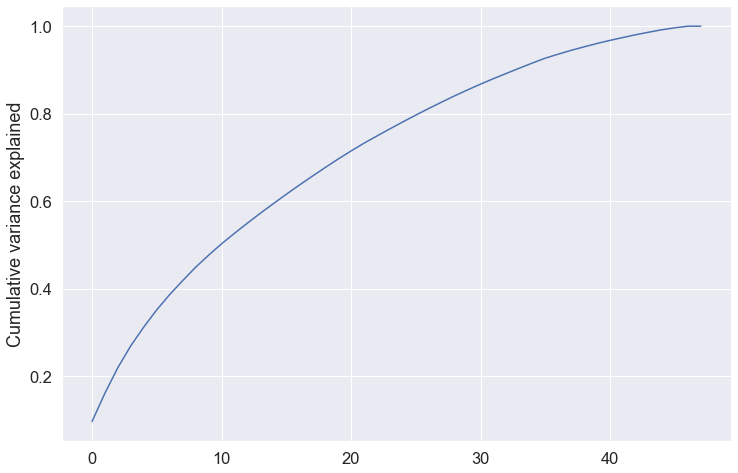

In [0]:
fig = plt.figure(figsize=[12,8])
#plt.vlines(x=15, ymax=1, ymin=0, colors="r", linestyles="--")
#plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

It is evident from the above Scree plot that **more than 90% variance** is explained by the **first 34 principal components**. Hence, we will use these components  going forward for Model building process.

In [0]:
from sklearn.decomposition import IncrementalPCA

pca_final = IncrementalPCA(n_components=34)
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(13739, 34)

#### Heatmap of the PCA components

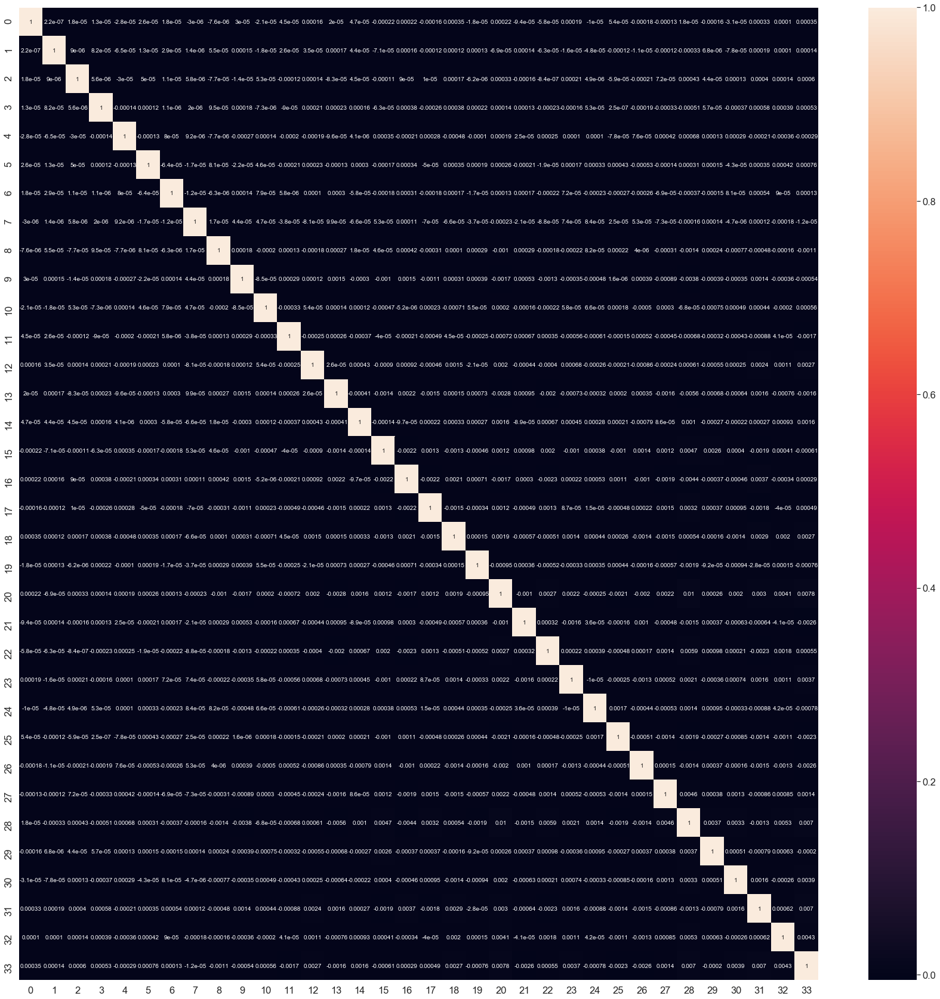

In [0]:
corrmat = np.corrcoef(df_train_pca.transpose())
plt.figure(figsize=[30,30])
sns.heatmap(corrmat, annot=True,annot_kws={"size":10})

#### Applying the PCA transformation on test set

In [0]:
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(5889, 34)

### Conclusion on PCA

On using PCA, we have reduced the features from 48 to 34.

First 34 prinicipal components are able to provide more than **90% Variance**

## Logistic Regression with PCA

In [0]:
from sklearn.linear_model import LogisticRegression

### Since we have imbalanced data we are using class_weight = 'balanced'
learner_pca = LogisticRegression(random_state=0,class_weight='balanced')

In [0]:
model_pca = learner_pca.fit(df_train_pca, y_train)

In [0]:
y_train_pred = model_pca.predict(df_train_pca)

In [0]:
# Predicted probabilities
y_test_pred = model_pca.predict(df_test_pca)

In [0]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [0]:
print("Logistic Regression accuracy with PCA: ",accuracy_score(y_train,y_train_pred))

Logistic Regression accuracy with PCA:  0.8295363563578135


In [0]:
# Printing confusion matrix of train

con_train = confusion_matrix(y_train,y_train_pred)
print(confusion_matrix(y_train,y_train_pred))

[[10355  2109]
 [  233  1042]]


In [0]:
TP = con_train[1,1] # true positive 
TN = con_train[0,0] # true negatives
FP = con_train[0,1] # false positives
FN = con_train[1,0] # false negatives

In [0]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8172549019607843

In [0]:
# Let us calculate specificity
TN / float(TN+FP)

0.8307926829268293

In [0]:
# Precision 
TP/float(TP+FP)

0.3306886702634084

In [0]:
# Recall
TP/float(TP+FN)

0.8172549019607843

In [0]:
print("Logistic Regression accuracy with PCA: ",accuracy_score(y_test,y_test_pred))

Logistic Regression accuracy with PCA:  0.8273051451859399


In [0]:
# Printing confusion matrix of test
con_test = confusion_matrix(y_test,y_test_pred)
print(confusion_matrix(y_test,y_test_pred))

[[4443  914]
 [ 103  429]]


In [0]:
TP = con_test[1,1] # true positive 
TN = con_test[0,0] # true negatives
FP = con_test[0,1] # false positives
FN = con_test[1,0] # false negatives

In [0]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.806390977443609

In [0]:
# Let us calculate specificity
TN / float(TN+FP)

0.8293821168564495

In [0]:
# Precision 
TP/float(TP+FP)

0.31943410275502604

In [0]:
# Recall
TP/float(TP+FN)

0.806390977443609

### Conclusion on Logistic Regression with PCA

**34** Features can obtain optimal accuracy with **90% Variance**

#### Evaluation metric Results

#### TRAIN Results
        
        Accuracy - 82.95
        Sensitivity - 81.75
        Specificity - 83.07
        
#### TEST Results
    
        Accuracy - 82.73
        Sensitivity - 80.63
        Specificity - 82.93

# Random Forest

#### Default Hyperparameters
Let's first fit a random forest model with default hyperparameters.

In [0]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc =  RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)


In [0]:
# fit
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=-1, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [0]:
# Making predictions
predictions = rfc.predict(df_test_pca)
#print(X_train.shape,X_test.shape)

In [0]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [0]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      5357
           1       0.68      0.23      0.34       532

    accuracy                           0.92      5889
   macro avg       0.80      0.61      0.65      5889
weighted avg       0.91      0.92      0.90      5889



In [0]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[5300   57]
 [ 412  120]]


In [0]:
print(accuracy_score(y_test,predictions))

0.9203599932076754


So far so good, let's now look at the list of hyperparameters which we can tune to improve model performance.

### Tuning max_depth

Let's try to find the optimum values for max_depth and understand how the value of max_depth impacts the overall accuracy of the ensemble.

In [0]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV,StratifiedKFold



# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# create 5 folds
n_folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# instantiate the model
rf = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=-1,
                                              oob_score=False,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,19.92,39.06,0.14,0.01,2,{'max_depth': 2},0.80,0.81,0.86,0.83,0.84,0.83,0.02,4,0.80,0.82,0.85,0.83,0.84,0.83,0.02
1,0.40,0.04,0.11,0.01,7,{'max_depth': 7},0.89,0.89,0.90,0.88,0.89,0.89,0.01,3,0.91,0.91,0.91,0.89,0.90,0.91,0.01
2,0.53,0.11,0.12,0.01,12,{'max_depth': 12},0.90,0.91,0.92,0.91,0.92,0.91,0.01,2,0.96,0.96,0.96,0.96,0.96,0.96,0.00
3,0.51,0.06,0.11,0.01,17,{'max_depth': 17},0.92,0.91,0.92,0.92,0.92,0.92,0.00,1,0.98,0.97,0.98,0.98,0.98,0.98,0.00


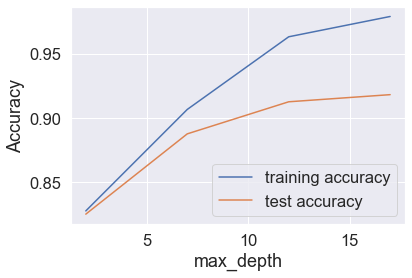

In [0]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


You can see that as we increase the value of max_depth, train scores increase till a point, but test score increases slowly. The ensemble tries to overfit as we increase the max_depth. So it is recommended to keep the max_depth to minimum.

Thus, controlling the depth of the constituent trees will help reduce overfitting in the forest.

### Tuning n_estimators

Let's try to find the optimum values for n_estimators and understand how the value of n_estimators impacts the overall accuracy. Notice that we'll specify an appropriately low value of max_depth, so that the trees do not overfit.

In [0]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV,StratifiedKFold


# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}


# create 5 folds
n_folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# instantiate the model
rf = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=-1,
                                              oob_score=False,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,3.91,0.42,0.12,0.00,100,{'n_estimators': 100},0.92,0.92,0.92,0.92,0.92,0.92,0.00,4,1.00,1.00,1.00,1.00,1.00,1.00,0.00
1,16.86,1.29,0.40,0.07,500,{'n_estimators': 500},0.92,0.92,0.92,0.93,0.92,0.92,0.00,3,1.00,1.00,1.00,1.00,1.00,1.00,0.00
2,28.45,2.69,0.63,0.05,900,{'n_estimators': 900},0.92,0.92,0.92,0.93,0.92,0.92,0.00,2,1.00,1.00,1.00,1.00,1.00,1.00,0.00
3,43.84,2.46,0.93,0.10,1300,{'n_estimators': 1300},0.92,0.92,0.92,0.93,0.92,0.92,0.00,1,1.00,1.00,1.00,1.00,1.00,1.00,0.00


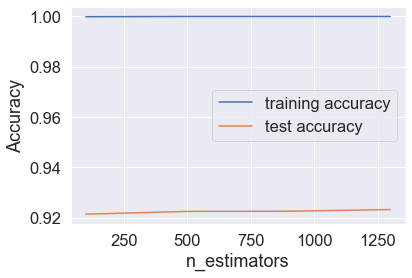

In [0]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


### Tuning max_features

Let's see how the model performance varies with max_features, which is the maximum numbre of features considered for splitting at a node.

In [0]:
# GridSearchCV to find optimal max_features
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV,StratifiedKFold


# create 5 folds
n_folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# instantiate the model
rf = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)


# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}



# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=-1,
                                              oob_score=False,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.39,0.09,0.12,0.01,4,{'max_features': 4},0.92,0.91,0.92,0.92,0.92,0.92,0.00,5,0.99,0.99,0.99,0.99,0.99,0.99,0.00
1,0.58,0.03,0.12,0.01,8,{'max_features': 8},0.92,0.92,0.92,0.92,0.92,0.92,0.00,3,0.99,0.99,0.99,0.99,0.99,0.99,0.00
2,0.80,0.07,0.11,0.00,14,{'max_features': 14},0.92,0.92,0.92,0.92,0.92,0.92,0.00,2,0.99,0.99,0.99,0.99,0.99,0.99,0.00
3,1.18,0.07,0.12,0.01,20,{'max_features': 20},0.92,0.92,0.92,0.92,0.92,0.92,0.00,3,0.99,0.99,0.99,0.99,0.99,0.99,0.00
4,1.33,0.20,0.12,0.01,24,{'max_features': 24},0.92,0.92,0.92,0.92,0.92,0.92,0.00,1,0.99,0.99,0.99,0.99,0.99,0.99,0.00


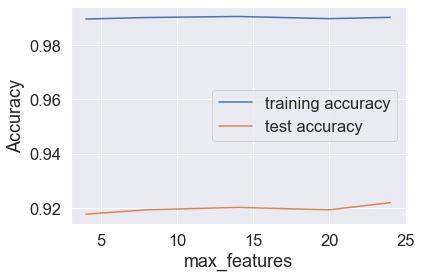

In [0]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


Apparently, the training and test scores both seem to be same as we increase max_features, and after a certain point test accuracy starts decreasing.

### Tuning min_samples_leaf

The hyperparameter **min_samples_leaf** is the minimum number of samples required to be at a leaf node:
- If int, then consider min_samples_leaf as the minimum number.
- If float, then min_samples_leaf is a percentage and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.

Let's now check the optimum value for min samples leaf in our case.

In [0]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV,StratifiedKFold


# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}


# create 5 folds
n_folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# instantiate the model
rf = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=-1,
                                              oob_score=False,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.96,1.11,0.12,0.01,100,{'min_samples_leaf': 100},0.87,0.85,0.87,0.87,0.87,0.87,0.01,1,0.88,0.88,0.87,0.88,0.88,0.88,0.00
1,1.10,0.86,0.12,0.01,150,{'min_samples_leaf': 150},0.86,0.86,0.87,0.85,0.87,0.86,0.01,3,0.87,0.87,0.87,0.86,0.88,0.87,0.00
2,1.43,1.26,0.12,0.01,200,{'min_samples_leaf': 200},0.86,0.85,0.87,0.85,0.87,0.86,0.01,2,0.86,0.87,0.87,0.86,0.88,0.87,0.01
3,0.51,0.09,0.12,0.00,250,{'min_samples_leaf': 250},0.85,0.86,0.85,0.84,0.85,0.85,0.01,6,0.86,0.87,0.85,0.85,0.85,0.86,0.01
4,0.30,0.10,0.11,0.00,300,{'min_samples_leaf': 300},0.84,0.85,0.87,0.85,0.85,0.85,0.01,5,0.86,0.86,0.86,0.86,0.84,0.86,0.01


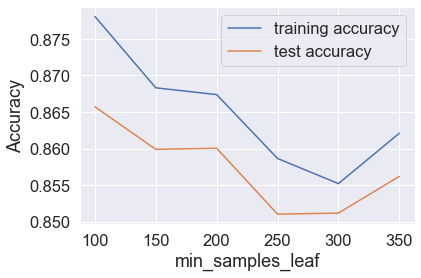

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Both test and train accuracy seem to decrease in the same pattern and after a certain point they incrrease slowly.

### Tuning min_samples_split

Let's now look at the performance of the ensemble as we vary min_samples_split.

In [0]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV,StratifiedKFold


# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}


# create 5 folds
n_folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# instantiate the model
rf = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True)
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=-1,
                                              oob_score=False,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.50,0.13,0.12,0.01,200,{'min_samples_split': 200},0.88,0.88,0.89,0.88,0.89,0.88,0.01,1,0.90,0.90,0.90,0.90,0.90,0.90,0.00
1,0.43,0.06,0.11,0.00,250,{'min_samples_split': 250},0.88,0.87,0.89,0.87,0.89,0.88,0.01,2,0.89,0.89,0.89,0.89,0.89,0.89,0.00
2,0.34,0.04,0.12,0.01,300,{'min_samples_split': 300},0.87,0.87,0.88,0.87,0.88,0.87,0.00,3,0.89,0.88,0.89,0.89,0.89,0.89,0.00
3,0.35,0.03,0.12,0.00,350,{'min_samples_split': 350},0.87,0.87,0.87,0.86,0.87,0.87,0.01,5,0.89,0.88,0.88,0.87,0.88,0.88,0.01
4,0.35,0.03,0.12,0.01,400,{'min_samples_split': 400},0.87,0.86,0.88,0.86,0.88,0.87,0.01,4,0.88,0.88,0.88,0.88,0.88,0.88,0.00


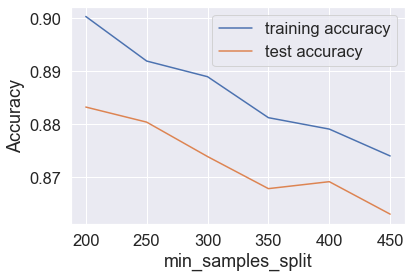

In [0]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Here the train and test accuracy seems to be almost same and hence there is no overfitting as we increase the min_samples_split

### Finding the optimal hyperparameters

We can now find the optimal hyperparameters using GridSearchCV.

In [0]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}

# create 5 folds
n_folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# Create a based model
rf = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1,random_state=100)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1,return_train_score=True)

In [0]:
# Fit the grid search to the data
grid_search.fit(df_train_pca, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 13.5min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=-1,
                                              oob_score=False, random_state=100,
                                              verbose=0, warm_start=False),
       

In [0]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.8852900502219958 using {'max_depth': 10, 'max_features': 5, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 200}


### Fitting the final model with the best parameters obtained from grid search.

In [0]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=5,
                             n_estimators=300,class_weight={0:0.072, 1: 0.928}, n_jobs = -1,random_state=100)

In [0]:
# fit
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight={0: 0.072, 1: 0.928},
                       criterion='gini', max_depth=4, max_features=5,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=100,
                       min_samples_split=200, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=-1, oob_score=False,
                       random_state=100, verbose=0, warm_start=False)

In [0]:
# predict
predictions = rfc.predict(df_test_pca)

### Evaluation metrics for Random Forest:

In [0]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [0]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.79      0.87      5357
           1       0.28      0.80      0.41       532

    accuracy                           0.79      5889
   macro avg       0.63      0.79      0.64      5889
weighted avg       0.91      0.79      0.83      5889



In [0]:
print(confusion_matrix(y_test,predictions))

[[4242 1115]
 [ 108  424]]


In [0]:
print (metrics.accuracy_score(y_test, predictions))

0.7923246731193752


In [0]:
from imblearn.metrics import sensitivity_specificity_support
# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, predictions, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')


ModuleNotFoundError: No module named 'imblearn'

### Conclusion From Random Forest:
1. The accuracy of the model using random forest: **82.4%**
2. Sensitivity: 	**65%**
3. Specificity: 	**84%**

## Decision Tree Classifier
### Dealing class imbalance with SMOTE
#### **Synthetic Minority Oversampling TEchnique (SMOTE)** is a very popular oversampling method that was proposed to improve random oversampling. This is a statistical technique for increasing the number of cases in your dataset in a balanced way. The module works by generating new instances from existing minority cases that you supply as input.

In [0]:

# apply SMOTE to tackle class imbalance
from imblearn.over_sampling import SMOTE
sm = SMOTE(kind = "regular",random_state=100)
X_tr,y_tr = sm.fit_sample(df_train_pca,y_train)
print(X_tr.shape)
print(y_tr.shape)

#### feature selection using lasso

In [0]:
# feature selection using lasso
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel
 
svc = LinearSVC(C=0.001, penalty="l1", dual=False).fit(X_tr, y_tr)
svc_model = SelectFromModel(svc, prefit=True)
X_lasso = svc_model.transform(X_tr)
position = svc_model.get_support(indices=True)

print(X_lasso.shape)
print(position)

In [0]:
# feature vector for decision tree
lasso_features = list(df.columns[position])
print("Lasso Features: ", lasso_features)

### DecisionTreeClassifier with default values:

In [0]:
# import decision tree libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# lets create a decision tree with the default hyper parameters except max depth to make the tree readable
dt1 = DecisionTreeClassifier(max_depth=5,random_state=100)
dt1.fit(X_lasso, y_tr)

In [0]:
# lets see the classification report of the model built
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Model predictions
X_test = pd.DataFrame(data=df_test_pca).iloc[:, position]
y_pred1 = dt1.predict(X_test)

# classification report
print(classification_report(y_test, y_pred1))

In [0]:
# confusion matrix
print(confusion_matrix(y_test,y_pred1))
# accuracy of the decision tree
print('Decision Tree - Accuracy :',accuracy_score(y_test,y_pred1))

Thus we got an accuracy of 90.5% with default values. Now lets try to improve this using hyperparameter tuning.

### Hyperparameter Fine Tuning

In [0]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)
                               
# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score=True)
tree.fit(X_lasso, y_tr)


In [0]:
# grid search results
score = tree.cv_results_
pd.DataFrame(score).head()

In [0]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(score["param_max_depth"], 
         score["mean_train_score"], 
         label="training accuracy")
plt.plot(score["param_max_depth"], 
         score["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# max_depth =5 seems to be the optimal one

 max_depth =5 seems to be the optimal one

In [0]:
# lets find optimal value of minimum sample leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score=True)
tree.fit(X_lasso, y_tr)

In [0]:
# grid search results
score = tree.cv_results_
pd.DataFrame(score).head()

In [0]:
# plotting accuracies with min_sample_leaf
plt.figure()
plt.plot(score["param_min_samples_leaf"], 
         score["mean_train_score"], 
         label="training accuracy")
plt.plot(score["param_min_samples_leaf"], 
         score["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_sample_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# min_sample_leaf =25 seems to be the optimal one


min_sample_leaf =25 seems to be the optimal one

In [0]:
# lets fine tune min sample split now
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score=True)
tree.fit(X_lasso, y_tr)

In [0]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# min_samples_split=50 seems to be optimal

min_samples_split=50 seems to be optimal

In [0]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(25, 175, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(random_state=100)
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_lasso, y_tr)

In [0]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results
# printing the optimal accuracy score and hyperparameters
print("Best Accuracy Using Decision Tree Classifier : ", grid_search.best_score_)

#### Calculating the best estimator hyperparameters to be used for Decision Tree Classifier:

In [0]:
print(grid_search.best_estimator_)

### Rerunning the Decision Tree Classifier model with optimal hyperparameters:

In [0]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=25, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')
clf_gini.fit(X_lasso, y_tr)

In [0]:

#Predict the response for test dataset
y_pred = clf_gini.predict(X_lasso)

### Evaluation Metrics:

In [0]:
# accuracy score
print ('Accuracy Score for Decision Tree Final Model :',clf_gini.score(X_test,y_test))

In [0]:
print(classification_report(y_tr,y_pred))

In [0]:
from imblearn.metrics import sensitivity_specificity_support
# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_tr, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')


### Conclusion from the above Decision Tree model
 1. Accuracy on the test dataset: **86.7%**
 2. Sensitivity: 	**87%**
 3. Specificity: **87%**


# Final Conclusion from the above Models:

### Logistic Regression without PCA:
   
1. Accuracy - **83.24%**
2. Sensitivity -**80.07%**
3. Specificity - **83.55%**
       

### Logistic Regression with PCA:

34 Features can obtain optimal accuracy with **90% Variance**

1. Accuracy - **82.73%**
2. Sensitivity - **80.63%**
3. Specificity - **82.93%**

### Random Forest with PCA

1. The accuracy of the model using random forest: **82.4%**
2. Sensitivity: 	**65%**
3. Specificity: 	**84%**

### Decision Tree model with PCA
 1. Accuracy on the test dataset: **86.7%**
 2. Sensitivity: 	**87%**
 3. Specificity: **87%**


## Concluding from various models:

From the above results, we can conclude that **Decision tree classifier**  proves to be the best model for this problem statement with best accuracy. **logistic regression without PCA** seems to be a good alternative with comparable results. Also the other metrics like sensitivity, specificity seems to be very good in Decision Tree Classifier model.
<br/>



## Strong predictors of Churn :<br/>       
####Positively Correlated features:
loc_ic_t2t_mou_8<br/>
std_ic_mou_8<br/>
avg_rech_amt_6_7<br/>
roam_ic_mou_8<br/>
      
####Negatively Correlated features:
std_ic_t2f_mou_8<br/>
sachet_2g_8<br/>
total_rech_num_8<br/>
aon<br/>
max_rech_amt_8<br/>
monthly_3g_8<br/>
monthly_2g_8<br/>
spl_ic_mou_8<br/>
total_og_mou_8<br/>
total_ic_mou_8<br/>

# Insights derived from the top influential features:
1. The incoming and outgoing calls in month 8 is most important predictor of churn
2. When age on network increases the customer churning probability decreases i.e., Long term customers have less probability to churn
3. If we could see high recharge amount in month 6 & 7 and there is drop in the recharge amount in month 8 then that customer has the possibility of churning
4. If the cutomer has taken any monthly schemes in the month of 8 then the customer has less probability to churn.
5. In month 8, if there is only incoming calls and there is no outgoing calls then there is a probability that the customer will churn.

# Recommendations:

1. It is recommended to make the customer stay on the network for long time, since the long term customers have less probability to churn.
2. Make the customer take up more monthly schemes since those who took such schemes have less probability to churn.
3. Pay more attention to users who has only incoming calls and no outgoing calls since they have more probability to churn.
4. If there is a sudden drop in the rate of recharges, then those customers should be given more offers to avoid churn.